# **HEALTHCARE WORKERS**

In [36]:
#Import necessary packages
import numpy as np 
import pandas as pd 
from scipy.stats import iqr as sc

#visualizing
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from shapely.geometry import Point, Polygon
import seaborn as sns
import numpy as np
import seaborn as sns
sns.set()
%matplotlib inline

#metrics and split
from sklearn.metrics import r2_score
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score

#model imports
from sklearn import linear_model
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import  ExtraTreesRegressor
from xgboost import XGBRegressor
from sklearn.linear_model import LogisticRegression

In [37]:
# load the dataset
hd = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/healthcare_data.csv') 

#View First
hd.head()

,EmployeeID,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,...,RelationshipSatisfaction,StandardHours,Shift,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,1313919,41,No,Travel_Rarely,1102,Cardiology,1,2,Life Sciences,1,...,1,80,0,8,0,1,6,4,0,5
1,1200302,49,No,Travel_Frequently,279,Maternity,8,1,Life Sciences,1,...,4,80,1,10,3,3,10,7,1,7
2,1060315,37,Yes,Travel_Rarely,1373,Maternity,2,2,Other,1,...,2,80,0,7,3,3,0,0,0,0
3,1272912,33,No,Travel_Frequently,1392,Maternity,3,4,Life Sciences,1,...,3,80,0,8,3,3,8,7,3,0
4,1414939,27,No,Travel_Rarely,591,Maternity,2,1,Medical,1,...,4,80,1,6,3,3,2,2,2,2


In [38]:
hd.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1676 entries, 0 to 1675
Data columns (total 35 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   EmployeeID                1676 non-null   int64 
 1   Age                       1676 non-null   int64 
 2   Attrition                 1676 non-null   object
 3   BusinessTravel            1676 non-null   object
 4   DailyRate                 1676 non-null   int64 
 5   Department                1676 non-null   object
 6   DistanceFromHome          1676 non-null   int64 
 7   Education                 1676 non-null   int64 
 8   EducationField            1676 non-null   object
 9   EmployeeCount             1676 non-null   int64 
 10  EnvironmentSatisfaction   1676 non-null   int64 
 11  Gender                    1676 non-null   object
 12  HourlyRate                1676 non-null   int64 
 13  JobInvolvement            1676 non-null   int64 
 14  JobLevel                

In [39]:
#Summary Statistics.
hd.agg(['mean','std','skew','median','max'])

,EmployeeID,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,...,RelationshipSatisfaction,StandardHours,Shift,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
mean,1.456796e+06,36.866348,NaN,NaN,800.557876,NaN,9.221957,2.907518,NaN,1.0,...,2.718377,80.0,0.806086,11.338902,2.805489,2.766110,7.033413,4.264916,2.200477,4.135442
std,2.487486e+05,9.129126,NaN,NaN,401.594438,NaN,8.158118,1.025835,NaN,0.0,...,1.078162,0.0,0.855527,7.834996,1.288431,0.702369,6.098991,3.627456,3.229587,3.559662
skew,-8.995335e-03,0.419614,NaN,NaN,0.003889,NaN,0.953314,-0.279411,NaN,0.0,...,-0.309785,0.0,0.949235,1.098286,0.535139,-0.570576,1.722257,0.904216,1.970435,0.806627
median,1.464606e+06,36.000000,NaN,NaN,796.500000,NaN,7.000000,3.000000,NaN,1.0,...,3.000000,80.0,1.000000,10.000000,3.000000,3.000000,5.000000,3.000000,1.000000,3.000000
max,1.886378e+06,60.000000,Yes,Travel_Rarely,1499.000000,Neurology,29.000000,5.000000,Technical Degree,1.0,...,4.000000,80.0,3.000000,40.000000,6.000000,4.000000,40.000000,18.000000,15.000000,17.000000


In [40]:
hd.describe()

,EmployeeID,Age,DailyRate,DistanceFromHome,Education,EmployeeCount,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobLevel,...,RelationshipSatisfaction,StandardHours,Shift,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
count,1.676000e+03,1676.000000,1676.000000,1676.000000,1676.000000,1676.0,1676.000000,1676.000000,1676.000000,1676.000000,...,1676.000000,1676.0,1676.000000,1676.000000,1676.000000,1676.000000,1676.000000,1676.000000,1676.000000,1676.000000
mean,1.456796e+06,36.866348,800.557876,9.221957,2.907518,1.0,2.714797,65.470167,2.724940,2.066826,...,2.718377,80.0,0.806086,11.338902,2.805489,2.766110,7.033413,4.264916,2.200477,4.135442
std,2.487486e+05,9.129126,401.594438,8.158118,1.025835,0.0,1.097534,20.207572,0.714121,1.113423,...,1.078162,0.0,0.855527,7.834996,1.288431,0.702369,6.098991,3.627456,3.229587,3.559662
min,1.025177e+06,18.000000,102.000000,1.000000,1.000000,1.0,1.000000,30.000000,1.000000,1.000000,...,1.000000,80.0,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,1.235832e+06,30.000000,465.000000,2.000000,2.000000,1.0,2.000000,48.000000,2.000000,1.000000,...,2.000000,80.0,0.000000,6.000000,2.000000,2.000000,3.000000,2.000000,0.000000,2.000000
50%,1.464606e+06,36.000000,796.500000,7.000000,3.000000,1.0,3.000000,65.500000,3.000000,2.000000,...,3.000000,80.0,1.000000,10.000000,3.000000,3.000000,5.000000,3.000000,1.000000,3.000000
75%,1.667992e+06,43.000000,1157.000000,14.000000,4.000000,1.0,4.000000,83.000000,3.000000,3.000000,...,4.000000,80.0,1.000000,15.000000,3.000000,3.000000,10.000000,7.000000,3.000000,7.000000
max,1.886378e+06,60.000000,1499.000000,29.000000,5.000000,1.0,4.000000,100.000000,4.000000,5.000000,...,4.000000,80.0,3.000000,40.000000,6.000000,4.000000,40.000000,18.000000,15.000000,17.000000


In [41]:
# How large is the dataset?
hd.shape

(1676, 35)

In [42]:
#any missing data?
hd.isna().sum()

EmployeeID                  0
Age                         0
Attrition                   0
BusinessTravel              0
DailyRate                   0
Department                  0
DistanceFromHome            0
Education                   0
EducationField              0
EmployeeCount               0
EnvironmentSatisfaction     0
Gender                      0
HourlyRate                  0
JobInvolvement              0
JobLevel                    0
JobRole                     0
JobSatisfaction             0
MaritalStatus               0
MonthlyIncome               0
MonthlyRate                 0
NumCompaniesWorked          0
Over18                      0
OverTime                    0
PercentSalaryHike           0
PerformanceRating           0
RelationshipSatisfaction    0
StandardHours               0
Shift                       0
TotalWorkingYears           0
TrainingTimesLastYear       0
WorkLifeBalance             0
YearsAtCompany              0
YearsInCurrentRole          0
YearsSince

In [43]:
#drop N/A
hd.dropna(inplace = True)

In [44]:
#Remove the NaN values from the dataset
hd.isnull().sum()
hd.dropna(how='any',inplace=True)
hd.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1676 entries, 0 to 1675
Data columns (total 35 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   EmployeeID                1676 non-null   int64 
 1   Age                       1676 non-null   int64 
 2   Attrition                 1676 non-null   object
 3   BusinessTravel            1676 non-null   object
 4   DailyRate                 1676 non-null   int64 
 5   Department                1676 non-null   object
 6   DistanceFromHome          1676 non-null   int64 
 7   Education                 1676 non-null   int64 
 8   EducationField            1676 non-null   object
 9   EmployeeCount             1676 non-null   int64 
 10  EnvironmentSatisfaction   1676 non-null   int64 
 11  Gender                    1676 non-null   object
 12  HourlyRate                1676 non-null   int64 
 13  JobInvolvement            1676 non-null   int64 
 14  JobLevel                

In [45]:
# How many Duplicate EmployeeId? 
hd.duplicated(subset="EmployeeID")

0       False
1       False
2       False
3       False
4       False
        ...  
1671    False
1672    False
1673    False
1674    False
1675    False
Length: 1676, dtype: bool

In [46]:
# Retrieve multiple values: 1st, 2nd and 5th.
hd.iloc[[0,1,4]]

,EmployeeID,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,...,RelationshipSatisfaction,StandardHours,Shift,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,1313919,41,No,Travel_Rarely,1102,Cardiology,1,2,Life Sciences,1,...,1,80,0,8,0,1,6,4,0,5
1,1200302,49,No,Travel_Frequently,279,Maternity,8,1,Life Sciences,1,...,4,80,1,10,3,3,10,7,1,7
4,1414939,27,No,Travel_Rarely,591,Maternity,2,1,Medical,1,...,4,80,1,6,3,3,2,2,2,2


In [47]:
# sum of monthly income
hd.MonthlyIncome.sum()

10921675

In [48]:
# mean monthly income
hd.MonthlyIncome.mean()

6516.512529832936

In [49]:
# max monthly income
hd.MonthlyIncome.max()

19999

In [50]:
# avg years promoted
hd.YearsSinceLastPromotion.mean()

2.200477326968974

In [51]:
# total distinct department in dataset
hd.groupby('Department').count()

,EmployeeID,Age,Attrition,BusinessTravel,DailyRate,DistanceFromHome,Education,EducationField,EmployeeCount,EnvironmentSatisfaction,...,RelationshipSatisfaction,StandardHours,Shift,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
Department,,,,,,,,,,,,,,,,,,,,,
Cardiology,531,531,531,531,531,531,531,531,531,531,...,531,531,531,531,531,531,531,531,531,531
Maternity,796,796,796,796,796,796,796,796,796,796,...,796,796,796,796,796,796,796,796,796,796
Neurology,349,349,349,349,349,349,349,349,349,349,...,349,349,349,349,349,349,349,349,349,349


In [52]:
#average hourly rate by department
hd.groupby(by='Department')['HourlyRate'].mean()

Department
Cardiology    65.610169
Maternity     66.227387
Neurology     63.530086
Name: HourlyRate, dtype: float64

In [53]:
hd.groupby(by='Gender')['YearsAtCompany'].mean()

Gender
Female    7.356932
Male      6.813627
Name: YearsAtCompany, dtype: float64

In [54]:
hd.groupby(by='JobRole')['PercentSalaryHike'].mean()

JobRole
Admin             15.875000
Administrative    15.165217
Nurse             15.043796
Other             15.329588
Therapist         15.449735
Name: PercentSalaryHike, dtype: float64

In [55]:
#how many people have a hourly rate more than 60 by education field? 
hd[hd['HourlyRate']>60].groupby(hd.EducationField).count()

,EmployeeID,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,...,RelationshipSatisfaction,StandardHours,Shift,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
EducationField,,,,,,,,,,,,,,,,,,,,,
Human Resources,13,13,13,13,13,13,13,13,13,13,...,13,13,13,13,13,13,13,13,13,13
Life Sciences,403,403,403,403,403,403,403,403,403,403,...,403,403,403,403,403,403,403,403,403,403
Marketing,112,112,112,112,112,112,112,112,112,112,...,112,112,112,112,112,112,112,112,112,112
Medical,289,289,289,289,289,289,289,289,289,289,...,289,289,289,289,289,289,289,289,289,289
Other,44,44,44,44,44,44,44,44,44,44,...,44,44,44,44,44,44,44,44,44,44
Technical Degree,86,86,86,86,86,86,86,86,86,86,...,86,86,86,86,86,86,86,86,86,86


In [56]:
hd.head(3)

,EmployeeID,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,...,RelationshipSatisfaction,StandardHours,Shift,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,1313919,41,No,Travel_Rarely,1102,Cardiology,1,2,Life Sciences,1,...,1,80,0,8,0,1,6,4,0,5
1,1200302,49,No,Travel_Frequently,279,Maternity,8,1,Life Sciences,1,...,4,80,1,10,3,3,10,7,1,7
2,1060315,37,Yes,Travel_Rarely,1373,Maternity,2,2,Other,1,...,2,80,0,7,3,3,0,0,0,0


In [57]:
#how much traveling for people with type 2 education
hd[hd.Education==2].groupby(hd.BusinessTravel).sum()

,EmployeeID,Age,DailyRate,DistanceFromHome,Education,EmployeeCount,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobLevel,...,RelationshipSatisfaction,StandardHours,Shift,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
BusinessTravel,,,,,,,,,,,,,,,,,,,,,
Non-Travel,63291942,1413,35872,545,84,42,112,2777,110,82,...,118,3360,28,373,109,115,282,144,77,177
Travel_Frequently,80790545,1940,43025,523,110,55,154,3459,152,96,...,155,4400,43,546,152,147,352,245,113,224
Travel_Rarely,328572927,8516,184687,1846,450,225,598,14979,612,487,...,630,18000,188,2583,653,628,1550,906,488,922


In [58]:
# What are the possible values of age? 
hd.Age.value_counts()

35    88
34    85
29    82
31    82
36    81
32    68
38    68
40    64
30    63
33    62
28    59
27    59
37    57
42    52
39    47
26    46
45    45
41    43
46    38
43    37
44    36
50    33
25    30
49    29
24    29
47    28
55    25
53    25
48    23
52    21
54    20
51    20
22    18
23    17
58    17
56    15
21    14
20    13
19    10
59    10
18     8
60     5
57     4
Name: Age, dtype: int64

 **Visualizing**

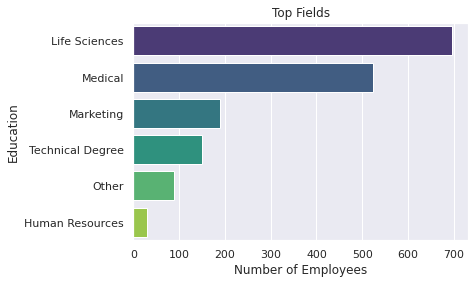

In [59]:
#fields with most employees
sns.set_style('darkgrid')
ch=hd['EducationField'].value_counts()[:10]
sns.barplot(x=ch,y=ch.index,palette='viridis')
plt.xlabel('Number of Employees')
plt.ylabel('Education')
plt.title("Top Fields")
plt.show()

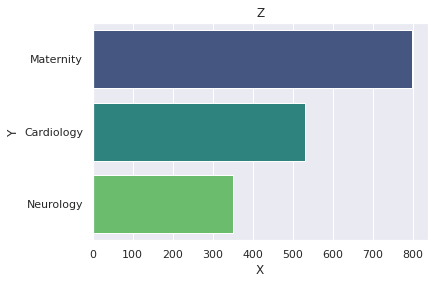

In [60]:
sns.set_style('darkgrid')
ch=hd['Department'].value_counts()[:10]
sns.barplot(x=ch,y=ch.index,palette='viridis')
plt.xlabel('X')
plt.ylabel('Y')
plt.title("Z")
plt.show()

/usr/local/lib/python3.7/dist-packages/seaborn/categorical.py:3717: UserWarning: The `factorplot` function has been renamed to `catplot`. The original name will be removed in a future release. Please update your code. Note that the default `kind` in `factorplot` (`'point'`) has changed `'strip'` in `catplot`.
  warnings.warn(msg)
/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


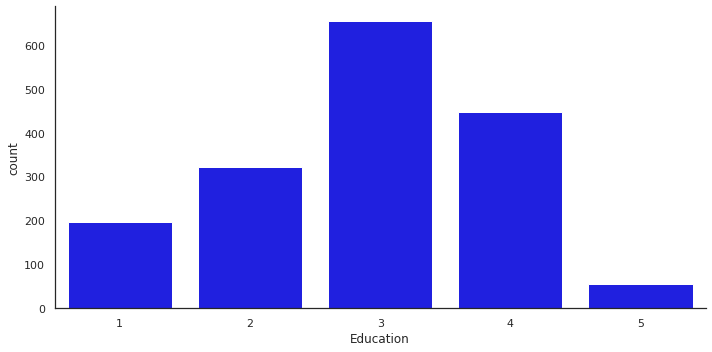

In [61]:
#how many education? 
with sns.axes_style('white'):
  g = sns.factorplot("Education", data = hd, aspect=2,
                     kind="count", color='blue')

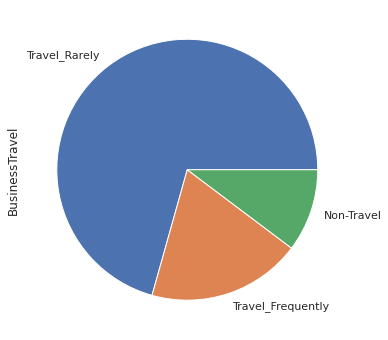

In [62]:
hd['BusinessTravel'].value_counts().plot(kind='pie', figsize=(6,6))

/usr/local/lib/python3.7/dist-packages/seaborn/categorical.py:3717: UserWarning: The `factorplot` function has been renamed to `catplot`. The original name will be removed in a future release. Please update your code. Note that the default `kind` in `factorplot` (`'point'`) has changed `'strip'` in `catplot`.
  warnings.warn(msg)
/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


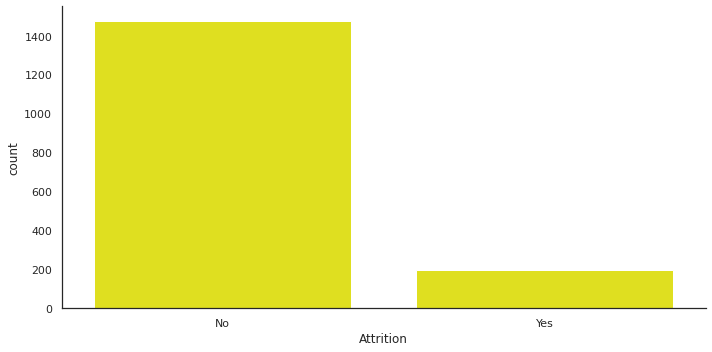

In [63]:
#how much attrition? 
with sns.axes_style('white'):
  g = sns.factorplot("Attrition", data = hd, aspect=2,
                     kind="count", color='yellow')

In [64]:
hd.head(2)

,EmployeeID,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,...,RelationshipSatisfaction,StandardHours,Shift,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,1313919,41,No,Travel_Rarely,1102,Cardiology,1,2,Life Sciences,1,...,1,80,0,8,0,1,6,4,0,5
1,1200302,49,No,Travel_Frequently,279,Maternity,8,1,Life Sciences,1,...,4,80,1,10,3,3,10,7,1,7


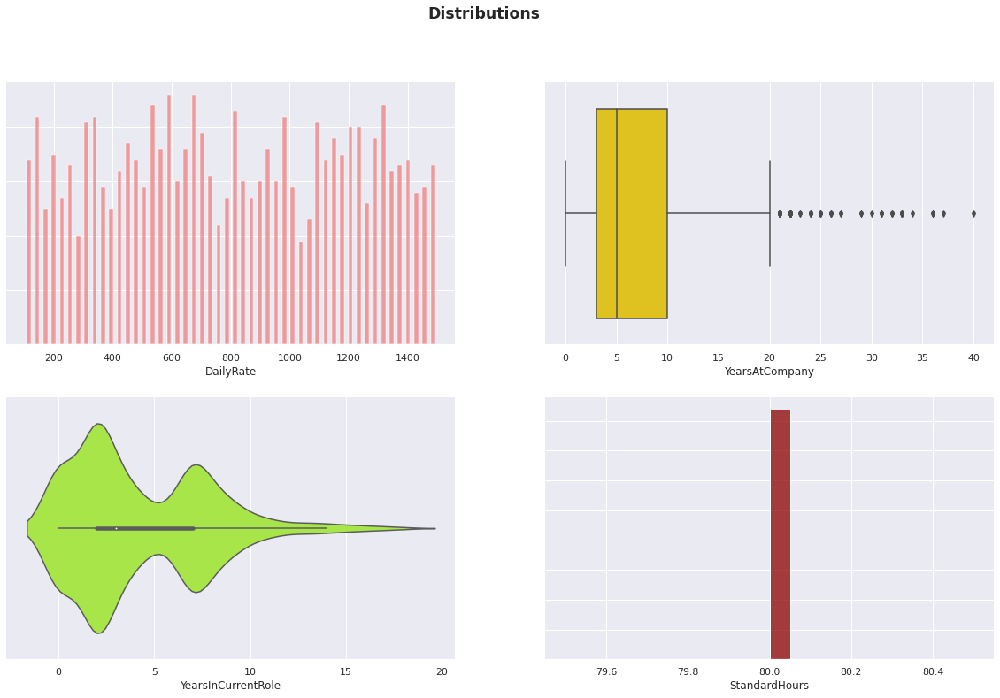

In [65]:
#distributions
fig=plt.figure(figsize=(20,12),facecolor='white')

plt.suptitle('Distributions',weight='bold',fontsize='xx-large')

gs=fig.add_gridspec(2,2)

ax=[_ for i in range(4)]

ax[0]=fig.add_subplot(gs[0,0])
ax[1]=fig.add_subplot(gs[0,1])
ax[2]=fig.add_subplot(gs[1,0])
ax[3]=fig.add_subplot(gs[1,1])


sns.histplot(x="DailyRate",data=hd,ax=ax[0],shrink=0.5,bins=50,color="lightcoral")
sns.histplot(x="StandardHours",data=hd,ax=ax[3],bins=20,color='darkred')
sns.boxplot(x='YearsAtCompany',data=hd,ax=ax[1],color='gold')
sns.violinplot(x="YearsInCurrentRole",data=hd,ax=ax[2],color="greenyellow")

for i in range(4):
    
    ax[i].set_yticklabels('')
    ax[i].set_ylabel('')
    ax[i].tick_params('y',length=0)
    
    for direction in ['top','left','right']:
        
        ax[i].spines[direction].set_visible(False)

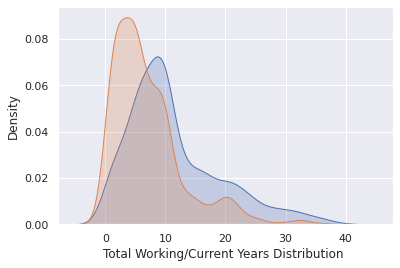

In [66]:
#distribtuion comparison of two variables
sns.kdeplot(hd["TotalWorkingYears"], label='IR', shade=True)
sns.kdeplot(hd["YearsAtCompany"], label='FC', shade=True)
plt.xlabel('Total Working/Current Years Distribution ');

Text(0.5, 1.0, 'Relation of Daily Rate to Total Years at role and with Manager')

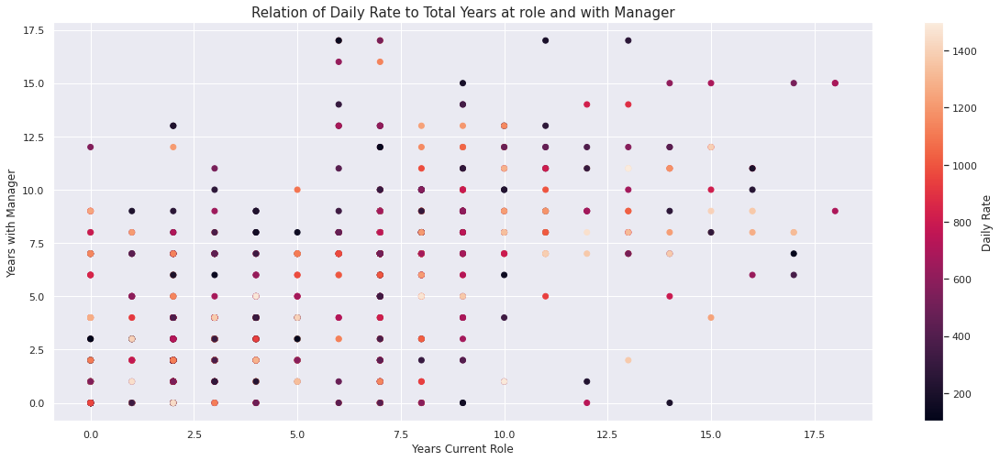

In [67]:
# Relation of Daily Rate to
plt.figure(figsize=(20, 8))
x, y, z = hd["YearsInCurrentRole"], hd["YearsWithCurrManager"], hd["DailyRate"]

sc = plt.scatter(x, y, c = z)
plt.xlabel("Years Current Role")
plt.ylabel("Years with Manager")
plt.colorbar(sc, label = "Daily Rate")
plt.title("Relation of Daily Rate to Total Years at role and with Manager", fontsize = 15)

Text(0, 0.5, '')

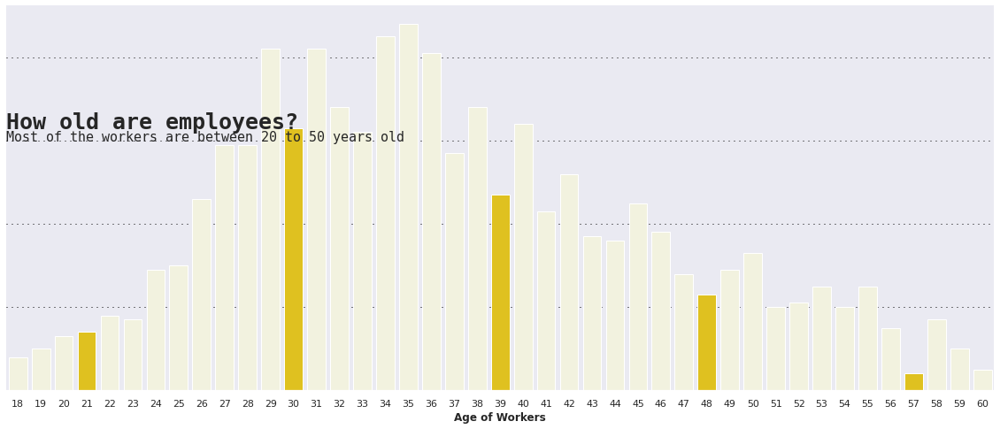

In [68]:
fig=plt.figure(figsize=(20,8),facecolor='white')
gs=fig.add_gridspec(1,1)

ax=[None]
ax[0]=fig.add_subplot(gs[0,0])

ax[0].text(-0.5, 63, 
         'How old are employees?', 
         fontsize=25, 
         fontweight='bold', 
         fontfamily='monospace',
        )

ax[0].text(-0.5, 60, 
         'Most of the workers are between 20 to 50 years old', 
         fontsize=15, 
         fontweight='light', 
         fontfamily='monospace'
        )

ax[0].grid(color='black', linestyle=':', axis='y', zorder=0,  dashes=(1,5))


colormap = ["beige" for _ in range(9)]
colormap[3] = "gold"

sns.countplot(data=hd,x='Age',ax=ax[0],palette=colormap,alpha=1,zorder=2)


for direction in ['top','right','left']:
    ax[0].spines[direction].set_visible(False)
    
    
ax[0].set_xlabel('Age of Workers',fontsize=12, fontweight='bold')

ax[0].set_yticklabels([])
ax[0].tick_params(axis='y',length=0)
ax[0].set_ylabel('',)

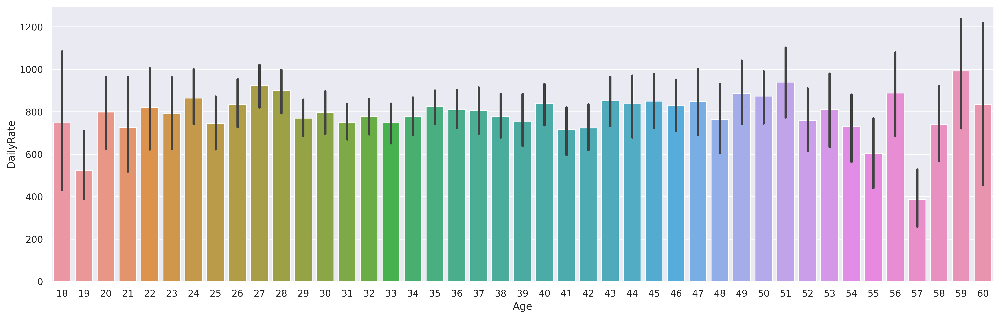

In [69]:
sns.set()
plt.figure(figsize = (20,6), dpi = 400)
sns.barplot( x = 'Age', y = 'DailyRate', data = hd)

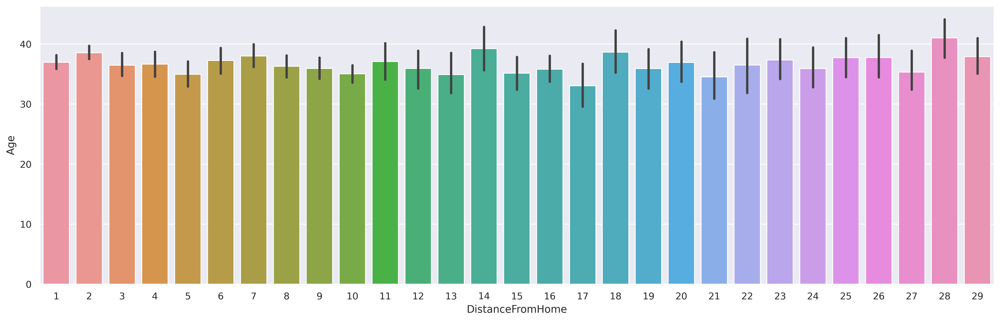

In [70]:
sns.set()
plt.figure(figsize = (20,6), dpi = 400)
sns.barplot( x = 'DistanceFromHome', y = 'Age', data = hd)

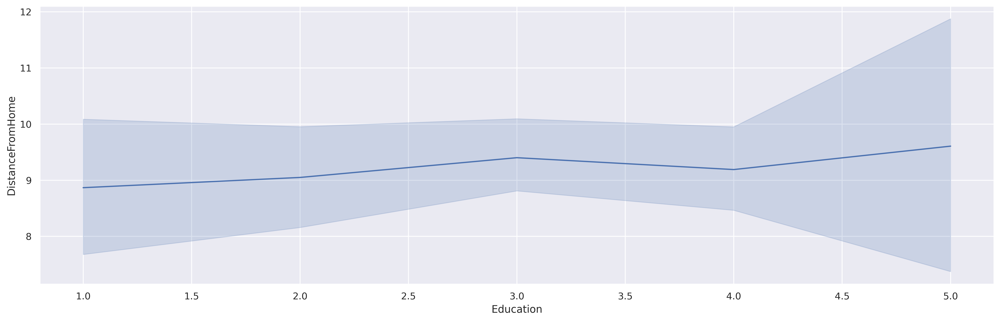

In [71]:
sns.set()
plt.figure(figsize = (20,6), dpi = 400)
sns.lineplot( x = 'Education',  y = 'DistanceFromHome', data = hd)

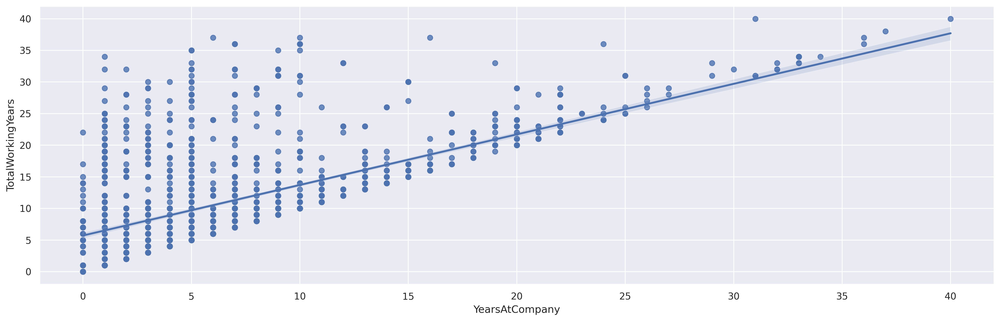

In [72]:
sns.set()
plt.figure(figsize= (20, 6), dpi = 300)
sns.regplot(x = 'YearsAtCompany', y= 'TotalWorkingYears', data = hd)

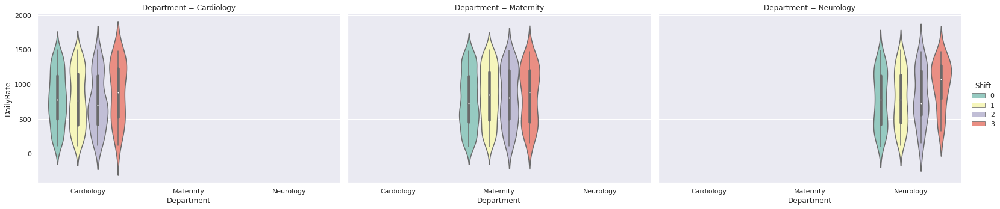

In [73]:
sns.catplot(x="Department", y="DailyRate", hue="Shift",
                col="Department", data=hd, palette="Set3",
                height=5, aspect=1.5,  kind="violin")

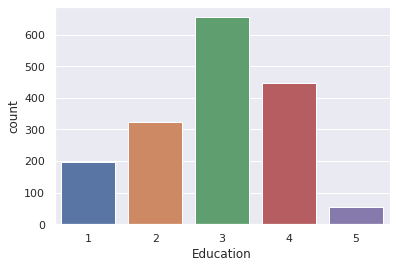

In [75]:
sns.countplot(x = 'Education', data = hd)

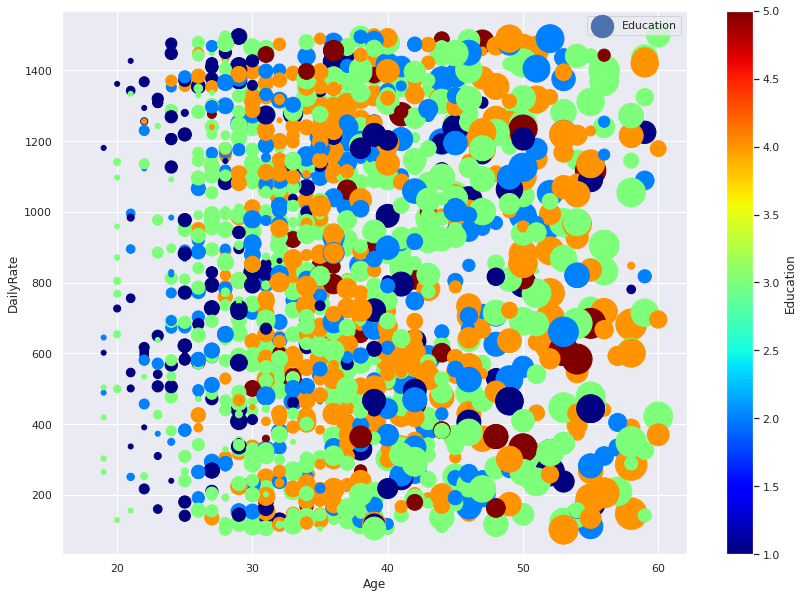

In [77]:
hd.plot(kind="scatter", x="Age", y="DailyRate", 
    s=hd["TotalWorkingYears"]*25, label="Education", figsize=(14,10),
    c='Education', cmap=plt.get_cmap("jet"), colorbar=True,
    sharex=False)
plt.legend()

In [78]:
num_cols = [col for col in hd.columns if hd[col].dtypes in ("int64", "float64")]
cat_cols = [col for col in hd.columns if hd[col].dtypes in ("object", "category")]

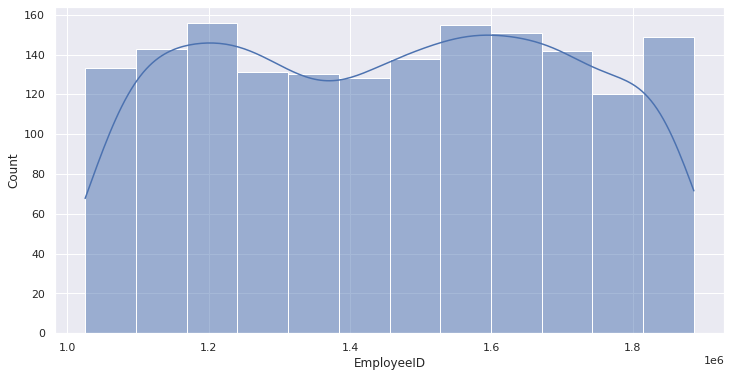

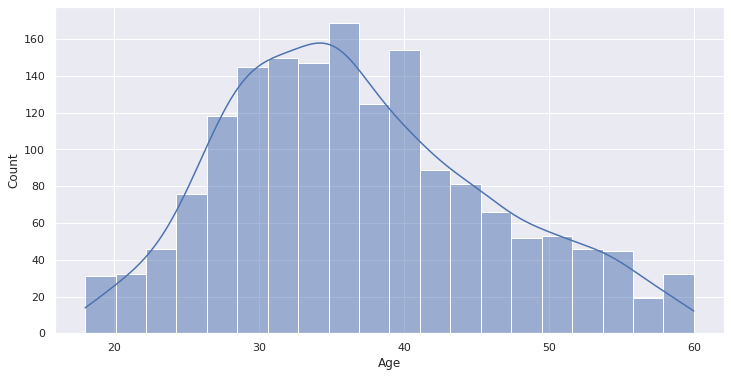

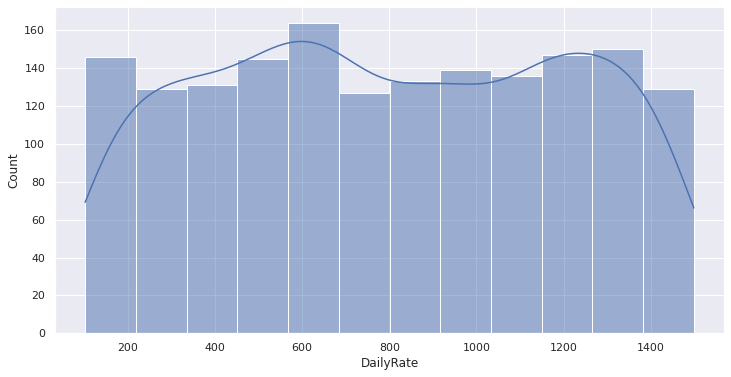

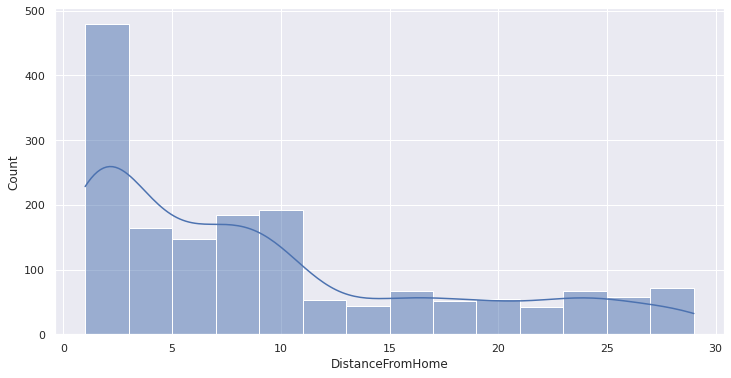

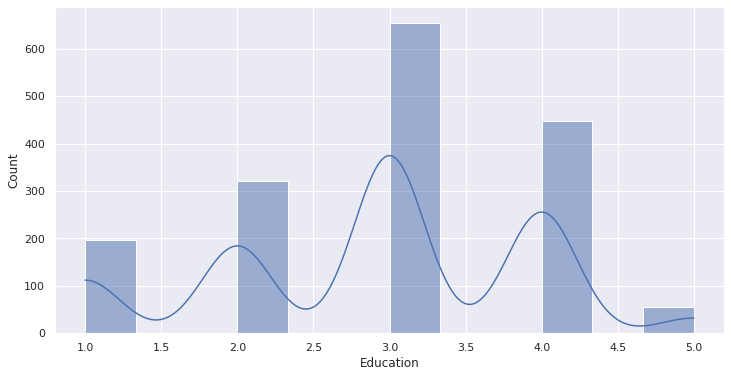

...

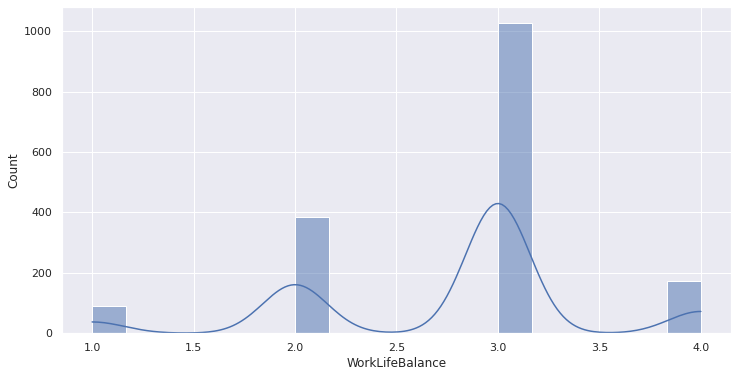

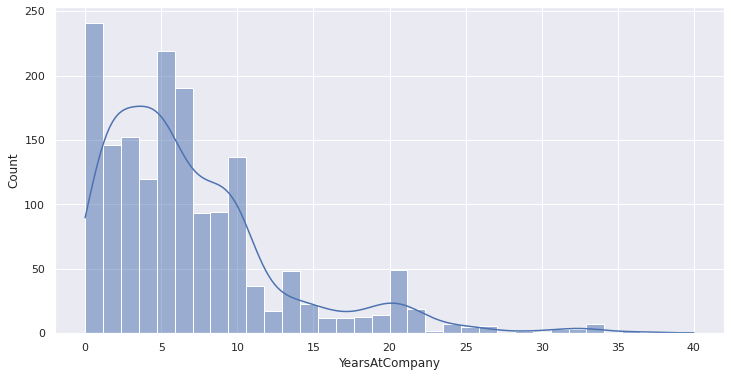

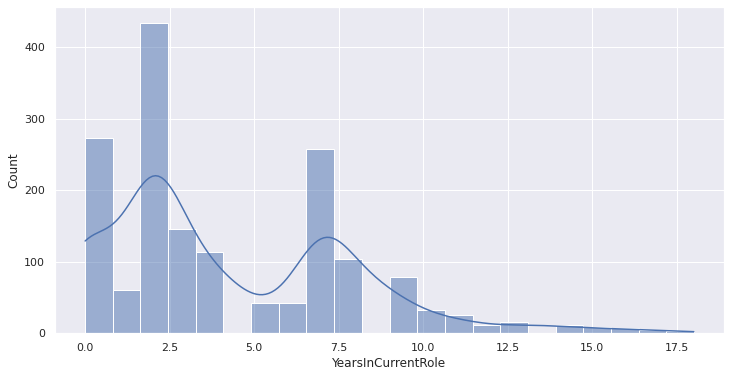

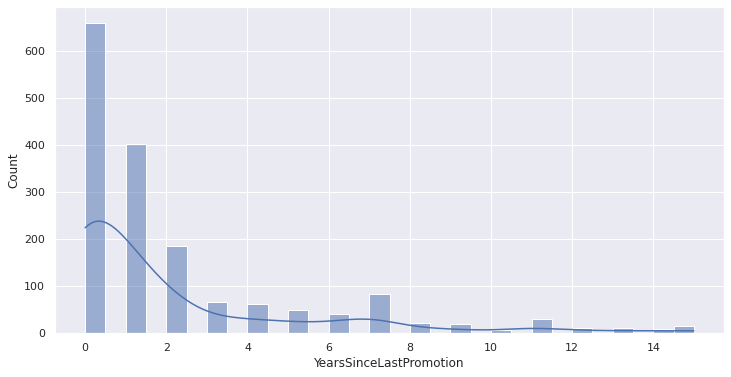

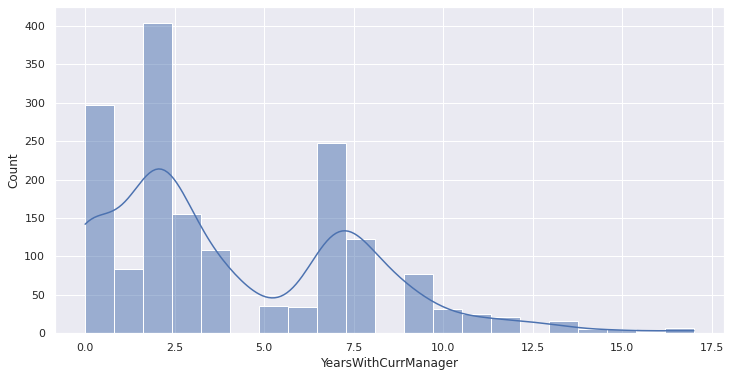

In [79]:
for col in num_cols:
    fig, ax = plt.subplots(1, figsize = (12, 6))
    sns.histplot(data = hd[col], kde = True)
    plt.show()

In [80]:
#hd.set_index("EmployeeID", inplace = True)
#hd.head()

In [81]:
to_cat = ["Education", "EnvironmentSatisfaction", "JobInvolvement", 
"JobLevel", "JobSatisfaction", "RelationshipSatisfaction", "WorkLifeBalance"]

hd.loc[:, to_cat].describe()

,Education,EnvironmentSatisfaction,JobInvolvement,JobLevel,JobSatisfaction,RelationshipSatisfaction,WorkLifeBalance
count,1676.000000,1676.000000,1676.000000,1676.000000,1676.000000,1676.000000,1676.000000
mean,2.907518,2.714797,2.724940,2.066826,2.738663,2.718377,2.766110
std,1.025835,1.097534,0.714121,1.113423,1.104005,1.078162,0.702369
min,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
25%,2.000000,2.000000,2.000000,1.000000,2.000000,2.000000,2.000000
50%,3.000000,3.000000,3.000000,2.000000,3.000000,3.000000,3.000000
75%,4.000000,4.000000,3.000000,3.000000,4.000000,4.000000,3.000000
max,5.000000,4.000000,4.000000,5.000000,4.000000,4.000000,4.000000


In [131]:
for col in to_cat:
    hd[col] = hd[col].astype("category")
    
hd.dtypes

EmployeeID                     int64
Age                            int64
Attrition                     object
BusinessTravel                object
DailyRate                      int64
Department                    object
DistanceFromHome               int64
Education                   category
EducationField                object
EmployeeCount                  int64
EnvironmentSatisfaction     category
Gender                        object
HourlyRate                     int64
JobInvolvement              category
JobLevel                    category
JobRole                       object
JobSatisfaction             category
MaritalStatus                 object
MonthlyIncome                  int64
MonthlyRate                    int64
NumCompaniesWorked             int64
Over18                        object
OverTime                      object
PercentSalaryHike              int64
PerformanceRating              int64
RelationshipSatisfaction    category
StandardHours                  int64
S

In [132]:
[cat_cols.append(col) for col in hd.columns if hd[col].dtype == "category"]
print(cat_cols)

['Attrition', 'BusinessTravel', 'Department', 'EducationField', 'Gender', 'JobRole', 'MaritalStatus', 'Over18', 'OverTime', 'Education', 'EnvironmentSatisfaction', 'JobInvolvement', 'JobLevel', 'JobSatisfaction', 'RelationshipSatisfaction', 'WorkLifeBalance']


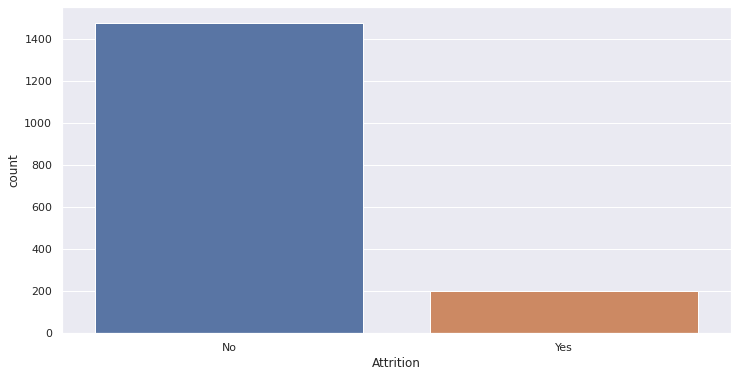

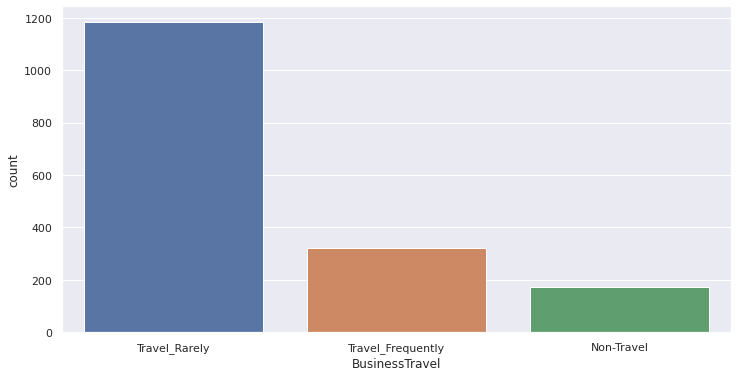

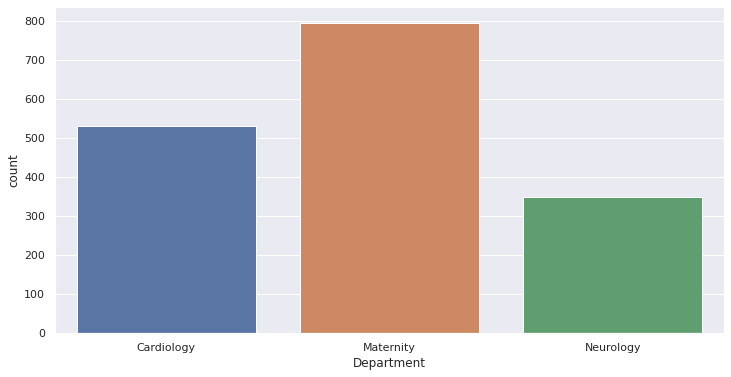

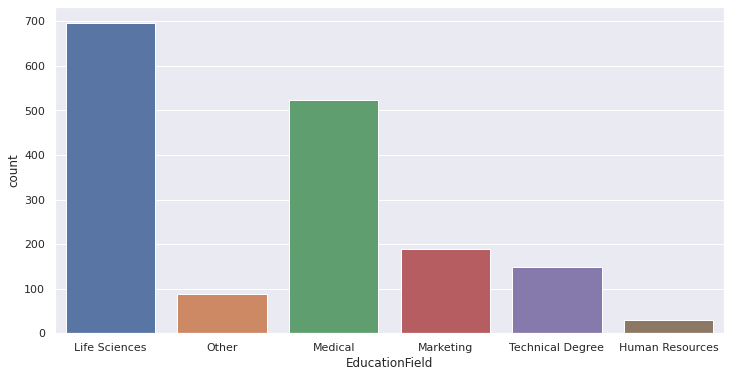

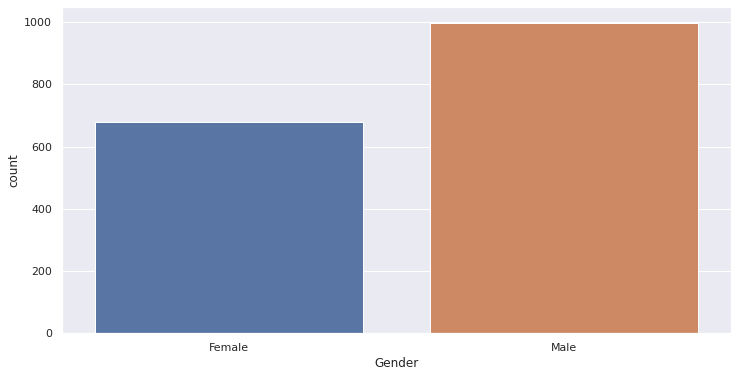

...

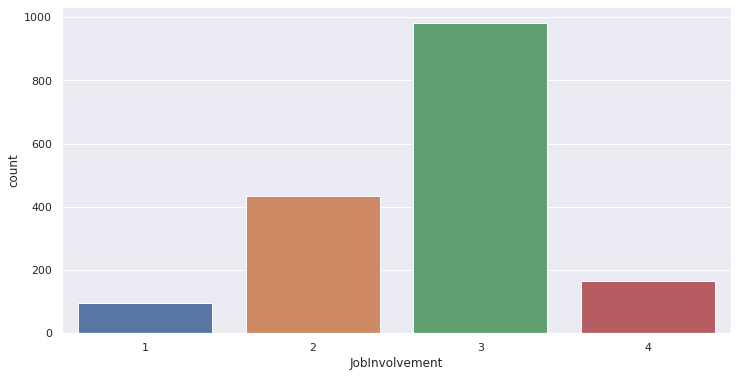

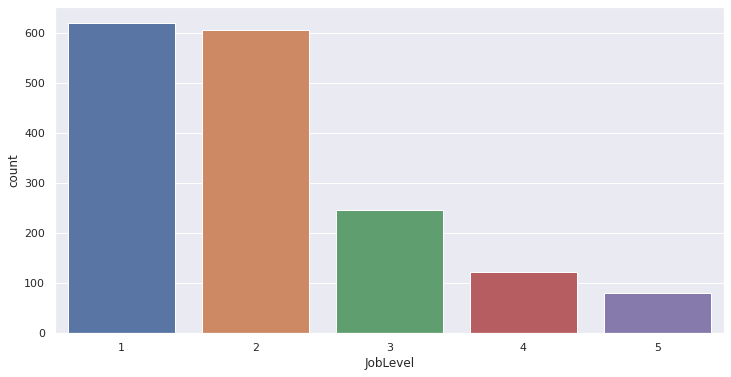

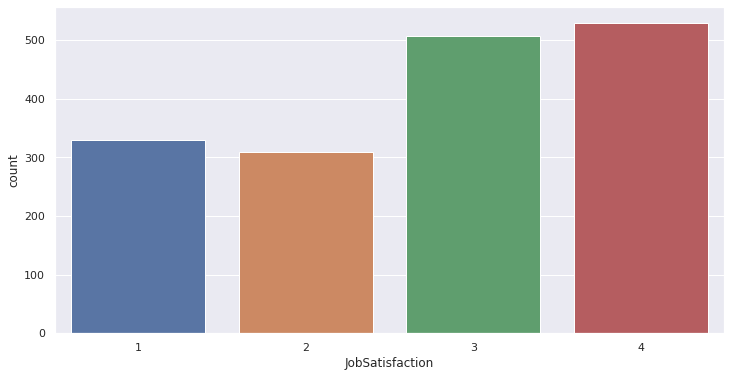

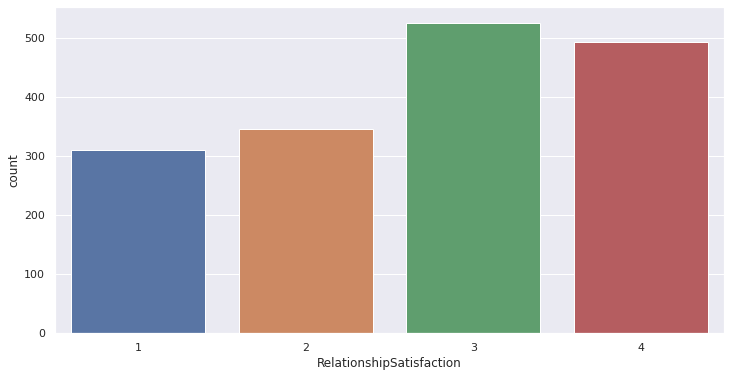

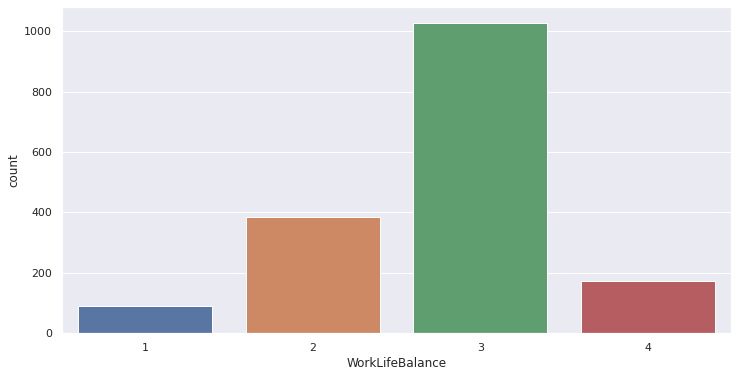

In [133]:
for col in cat_cols:
    fig, ax = plt.subplots(1, figsize = (12, 6))
    sns.countplot(
        x = col,
        data = hd)
    plt.show()


# **COVID-19** 

In [280]:
#Import necessary packages
import numpy as np 
import pandas as pd 
from scipy.stats import iqr as sc
import statsmodels.api as sm

#visualizing
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from shapely.geometry import Point, Polygon
import plotly.express as px
import seaborn as sns
import numpy as np
import seaborn as sns
sns.set()
%matplotlib inline

#metrics and split
from sklearn.metrics import r2_score
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score

#model imports
from sklearn import linear_model
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import  ExtraTreesRegressor
from xgboost import XGBRegressor
from sklearn.linear_model import LogisticRegression
from sklearn.linear_model import LassoCV
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.linear_model import LinearRegression, LassoCV, RidgeCV
from sklearn.metrics import mean_squared_error, r2_score

In [281]:
#Import Data
path = '../content/drive/MyDrive/Colab Notebooks/'

food = pd.read_csv(path+'Food_Supply_kcal_Data.csv')
fat = pd.read_csv(path+'Fat_Supply_Quantity_Data.csv')
protein = pd.read_csv(path+'Protein_Supply_Quantity_Data.csv')
desc = pd.read_csv(path+'Supply_Food_Data_Descriptions.csv')

In [282]:
#view first 3 records of protein dataset
protein.head(3)

,Country,Alcoholic Beverages,Animal Products,Animal fats,"Aquatic Products, Other",Cereals - Excluding Beer,Eggs,"Fish, Seafood",Fruits - Excluding Wine,Meat,...,Vegetables,Miscellaneous,Obesity,Undernourished,Confirmed,Deaths,Recovered,Active,Population,Unit (all except Population)
0,Afghanistan,0.0000,9.7523,0.0277,0.0,35.9771,0.4067,0.0647,0.5824,3.1337,...,1.1370,0.0462,4.5,29.8,0.142134,0.006186,0.123374,0.012574,38928000.0,%
1,Albania,0.1840,27.7469,0.0711,0.0,14.2331,1.8069,0.6274,1.2757,7.6582,...,3.2456,0.0544,22.3,6.2,2.967301,0.050951,1.792636,1.123714,2838000.0,%
2,Algeria,0.0323,13.8360,0.0054,0.0,26.5633,1.2916,0.6350,1.1624,3.5088,...,3.1267,0.1399,26.6,3.9,0.244897,0.006558,0.167572,0.070767,44357000.0,%


In [283]:
fat

,Country,Alcoholic Beverages,Animal Products,Animal fats,"Aquatic Products, Other",Cereals - Excluding Beer,Eggs,"Fish, Seafood",Fruits - Excluding Wine,Meat,...,Vegetable Oils,Vegetables,Obesity,Undernourished,Confirmed,Deaths,Recovered,Active,Population,Unit (all except Population)
0,Afghanistan,0.0000,21.6397,6.2224,0.0,8.0353,0.6859,0.0327,0.4246,6.1244,...,17.0831,0.3593,4.5,29.8,0.142134,0.006186,0.123374,0.012574,38928000.0,%
1,Albania,0.0000,32.0002,3.4172,0.0,2.6734,1.6448,0.1445,0.6418,8.7428,...,9.2443,0.6503,22.3,6.2,2.967301,0.050951,1.792636,1.123714,2838000.0,%
2,Algeria,0.0000,14.4175,0.8972,0.0,4.2035,1.2171,0.2008,0.5772,3.8961,...,27.3606,0.5145,26.6,3.9,0.244897,0.006558,0.167572,0.070767,44357000.0,%
3,Angola,0.0000,15.3041,1.3130,0.0,6.5545,0.1539,1.4155,0.3488,11.0268,...,22.4638,0.1231,6.8,25,0.061687,0.001461,0.056808,0.003419,32522000.0,%
4,Antigua and Barbuda,0.0000,27.7033,4.6686,0.0,3.2153,0.3872,1.5263,1.2177,14.3202,...,14.4436,0.2469,19.1,NaN,0.293878,0.007143,0.190816,0.095918,98000.0,%
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
165,Venezuela (Bolivarian Republic of),0.0000,16.3261,2.2673,0.0,2.5449,0.6555,0.5707,0.9640,7.0949,...,29.5211,0.1851,25.2,21.2,0.452585,0.004287,0.424399,0.023899,28645000.0,%
166,Vietnam,0.0000,33.2484,3.8238,0.0,3.7155,0.7839,1.1217,0.4079,26.4292,...,5.6211,0.6373,2.1,9.3,0.002063,0.000036,0.001526,0.000501,96209000.0,%
167,Yemen,0.0000,12.5401,2.0131,0.0,11.5271,0.5514,0.3847,0.2564,8.0010,...,23.6312,0.1667,14.1,38.9,0.007131,0.002062,0.004788,0.000282,29826000.0,%
168,Zambia,0.0783,9.6005,1.6113,0.0,14.3225,0.6266,1.0070,0.1343,4.9010,...,15.2848,0.1567,6.5,46.7,0.334133,0.004564,0.290524,0.039045,18384000.0,%


In [284]:
food

,Country,Alcoholic Beverages,Animal Products,Animal fats,"Aquatic Products, Other",Cereals - Excluding Beer,Eggs,"Fish, Seafood",Fruits - Excluding Wine,Meat,...,Vegetable Oils,Vegetables,Obesity,Undernourished,Confirmed,Deaths,Recovered,Active,Population,Unit (all except Population)
0,Afghanistan,0.0000,4.7774,0.8504,0.0,37.1186,0.1501,0.0000,1.4757,1.2006,...,2.3012,0.7504,4.5,29.8,0.142134,0.006186,0.123374,0.012574,38928000.0,%
1,Albania,0.9120,16.0930,1.0591,0.0,16.2107,0.8091,0.1471,3.8982,3.8688,...,2.8244,2.7508,22.3,6.2,2.967301,0.050951,1.792636,1.123714,2838000.0,%
2,Algeria,0.0896,6.0326,0.1941,0.0,25.0112,0.4181,0.1195,3.1805,1.2543,...,5.7638,2.0457,26.6,3.9,0.244897,0.006558,0.167572,0.070767,44357000.0,%
3,Angola,1.9388,4.6927,0.2644,0.0,18.3521,0.0441,0.8372,2.3133,2.9302,...,4.2741,0.3525,6.8,25,0.061687,0.001461,0.056808,0.003419,32522000.0,%
4,Antigua and Barbuda,2.3041,15.3672,1.5429,0.0,13.7215,0.2057,1.7280,3.6824,7.0356,...,4.6904,1.2960,19.1,NaN,0.293878,0.007143,0.190816,0.095918,98000.0,%
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
165,Venezuela (Bolivarian Republic of),0.8454,7.2303,0.6007,0.0,21.3126,0.2892,0.4449,2.3804,3.1368,...,7.5417,0.6674,25.2,21.2,0.452585,0.004287,0.424399,0.023899,28645000.0,%
166,Vietnam,0.7150,10.9806,0.9363,0.0,26.9833,0.2894,1.0385,1.8046,7.8311,...,1.3279,1.9578,2.1,9.3,0.002063,0.000036,0.001526,0.000501,96209000.0,%
167,Yemen,0.0000,3.4667,0.3394,0.0,32.0727,0.1455,0.1697,1.1879,2.0121,...,3.9515,0.3636,14.1,38.9,0.007131,0.002062,0.004788,0.000282,29826000.0,%
168,Zambia,1.1925,3.3043,0.3230,0.0,31.5528,0.1988,0.5714,0.2236,1.5155,...,3.0062,0.4472,6.5,46.7,0.334133,0.004564,0.290524,0.039045,18384000.0,%


In [285]:
desc

,Categories,Items
0,Alcoholic Beverages,"Alcohol, Non-Food; Beer; Beverages, Alcoholic;..."
1,Animal fats,"Butter, Ghee; Cream; Fats, Animals, Raw; Fish,..."
2,Animal Products,"Aquatic Animals, Others; Aquatic Plants; Bovin..."
3,"Aquatic Products, Other","Aquatic Animals, Others; Aquatic Plants; Meat,..."
4,Cereals - Excluding Beer,"Barley and products; Cereals, Other; Maize and..."
5,Eggs,Eggs
6,"Fish, Seafood",Cephalopods; Crustaceans; Demersal Fish; Fresh...
7,Fruits - Excluding Wine,"Apples and products; Bananas; Citrus, Other; D..."
8,Meat,"Bovine Meat; Meat, Other; Mutton & Goat Meat; ..."
9,Milk - Excluding Butter,Milk - Excluding Butter


In [286]:
desc.info

<bound method DataFrame.info of                   Categories  \
0        Alcoholic Beverages   
1                Animal fats   
2            Animal Products   
3    Aquatic Products, Other   
4   Cereals - Excluding Beer   
5                       Eggs   
6              Fish, Seafood   
7    Fruits - Excluding Wine   
8                       Meat   
9    Milk - Excluding Butter   
10             Miscellaneous   
11                    Offals   
12                  Oilcrops   
13                    Pulses   
14                    Spices   
15             Starchy Roots   
16                Stimulants   
17        Sugar & Sweeteners   
18               Sugar Crops   
19                  Treenuts   
20            Vegetable Oils   
21                Vegetables   
22          Vegetal Products   

                                                Items  
0   Alcohol, Non-Food; Beer; Beverages, Alcoholic;...  
1   Butter, Ghee; Cream; Fats, Animals, Raw; Fish,...  
2   Aquatic Animals, Others; Aq

In [287]:
#how big is the data set?
print(food.shape)
print(fat.shape)
print(protein.shape)


(170, 32)
(170, 32)
(170, 32)


In [288]:
#any missing data?
food.isnull().sum()

Country                         0
Alcoholic Beverages             0
Animal Products                 0
Animal fats                     0
Aquatic Products, Other         0
Cereals - Excluding Beer        0
Eggs                            0
Fish, Seafood                   0
Fruits - Excluding Wine         0
Meat                            0
Milk - Excluding Butter         0
Miscellaneous                   0
Offals                          0
Oilcrops                        0
Pulses                          0
Spices                          0
Starchy Roots                   0
Stimulants                      0
Sugar Crops                     0
Sugar & Sweeteners              0
Treenuts                        0
Vegetal Products                0
Vegetable Oils                  0
Vegetables                      0
Obesity                         3
Undernourished                  7
Confirmed                       6
Deaths                          6
Recovered                       6
Active        

In [289]:
#any missing data?
desc.isnull().sum()

Categories    0
Items         0
dtype: int64

In [290]:
#any missing data?
protein.isnull().sum()

Country                         0
Alcoholic Beverages             0
Animal Products                 0
Animal fats                     0
Aquatic Products, Other         0
Cereals - Excluding Beer        0
Eggs                            0
Fish, Seafood                   0
Fruits - Excluding Wine         0
Meat                            0
Milk - Excluding Butter         0
Offals                          0
Oilcrops                        0
Pulses                          0
Spices                          0
Starchy Roots                   0
Stimulants                      0
Sugar Crops                     0
Sugar & Sweeteners              0
Treenuts                        0
Vegetal Products                0
Vegetable Oils                  0
Vegetables                      0
Miscellaneous                   0
Obesity                         3
Undernourished                  7
Confirmed                       6
Deaths                          6
Recovered                       6
Active        

In [291]:
#any missing data?
fat.isnull().sum()

Country                         0
Alcoholic Beverages             0
Animal Products                 0
Animal fats                     0
Aquatic Products, Other         0
Cereals - Excluding Beer        0
Eggs                            0
Fish, Seafood                   0
Fruits - Excluding Wine         0
Meat                            0
Miscellaneous                   0
Milk - Excluding Butter         0
Offals                          0
Oilcrops                        0
Pulses                          0
Spices                          0
Starchy Roots                   0
Stimulants                      0
Sugar Crops                     0
Sugar & Sweeteners              0
Treenuts                        0
Vegetal Products                0
Vegetable Oils                  0
Vegetables                      0
Obesity                         3
Undernourished                  7
Confirmed                       6
Deaths                          6
Recovered                       6
Active        

In [292]:
#Remove the NaN values from the dataset
fat.isnull().sum()
fat.dropna(how='any',inplace=True)
fat.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 154 entries, 0 to 169
Data columns (total 32 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Country                       154 non-null    object 
 1   Alcoholic Beverages           154 non-null    float64
 2   Animal Products               154 non-null    float64
 3   Animal fats                   154 non-null    float64
 4   Aquatic Products, Other       154 non-null    float64
 5   Cereals - Excluding Beer      154 non-null    float64
 6   Eggs                          154 non-null    float64
 7   Fish, Seafood                 154 non-null    float64
 8   Fruits - Excluding Wine       154 non-null    float64
 9   Meat                          154 non-null    float64
 10  Miscellaneous                 154 non-null    float64
 11  Milk - Excluding Butter       154 non-null    float64
 12  Offals                        154 non-null    float64
 13  Oilcr

In [293]:
#Remove the NaN values from the dataset
desc.isnull().sum()
desc.dropna(how='any',inplace=True)

In [294]:
#Remove the NaN values from the dataset
protein.isnull().sum()
protein.dropna(how='any',inplace=True)

In [295]:
#Remove the NaN values from the dataset
food.isnull().sum()
food.dropna(how='any',inplace=True)
food.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 154 entries, 0 to 169
Data columns (total 32 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Country                       154 non-null    object 
 1   Alcoholic Beverages           154 non-null    float64
 2   Animal Products               154 non-null    float64
 3   Animal fats                   154 non-null    float64
 4   Aquatic Products, Other       154 non-null    float64
 5   Cereals - Excluding Beer      154 non-null    float64
 6   Eggs                          154 non-null    float64
 7   Fish, Seafood                 154 non-null    float64
 8   Fruits - Excluding Wine       154 non-null    float64
 9   Meat                          154 non-null    float64
 10  Milk - Excluding Butter       154 non-null    float64
 11  Miscellaneous                 154 non-null    float64
 12  Offals                        154 non-null    float64
 13  Oilcr

In [296]:
#summary statistics
food.describe()

,Alcoholic Beverages,Animal Products,Animal fats,"Aquatic Products, Other",Cereals - Excluding Beer,Eggs,"Fish, Seafood",Fruits - Excluding Wine,Meat,Milk - Excluding Butter,...,Treenuts,Vegetal Products,Vegetable Oils,Vegetables,Obesity,Confirmed,Deaths,Recovered,Active,Population
count,154.000000,154.000000,154.000000,154.000000,154.000000,154.000000,154.000000,154.000000,154.000000,154.000000,...,154.000000,154.000000,154.000000,154.000000,154.000000,154.000000,154.000000,154.000000,154.000000,1.540000e+02
mean,1.310975,9.050435,1.265275,0.003076,20.575647,0.421891,0.592167,2.008186,3.684662,2.938984,...,0.266022,40.950944,4.875444,1.066180,18.449351,2.060157,0.039882,1.464742,0.555533,4.796579e+07
std,1.080327,4.793536,1.316687,0.032440,6.506307,0.310935,0.550383,1.455394,2.116294,2.066412,...,0.293467,4.793145,2.184836,0.641302,9.519483,2.396535,0.049285,1.950855,1.359852,1.639258e+08
min,0.000000,1.623700,0.040800,0.000000,8.956500,0.018800,0.000000,0.147100,0.298000,0.116900,...,0.000000,27.708900,0.932500,0.095700,2.100000,0.000312,0.000000,0.000000,0.000000,7.200000e+04
25%,0.361300,4.810425,0.336850,0.000000,15.338125,0.130675,0.231125,1.184600,1.918425,1.069250,...,0.043175,36.931350,3.075900,0.589400,8.250000,0.141688,0.002086,0.095044,0.012857,3.403500e+06
50%,1.194250,8.730650,0.763300,0.000000,20.060950,0.393550,0.442200,1.679950,3.482050,2.675300,...,0.176050,41.273700,4.638450,0.989000,21.300000,1.035083,0.012576,0.476994,0.081040,1.058950e+07
75%,2.027450,13.073450,1.869675,0.000000,24.970375,0.629950,0.834400,2.383025,5.042525,4.376425,...,0.396200,45.201875,6.519100,1.334775,25.700000,3.534770,0.069680,2.643213,0.369904,3.383650e+07
max,5.157400,22.291100,7.800700,0.400700,37.526500,1.446100,4.418300,8.854000,10.567400,9.944100,...,1.421000,48.386400,10.383900,3.226900,45.500000,10.408199,0.185428,9.039871,8.019819,1.402385e+09


In [297]:
protein.agg(['mean','std','skew'])

,Alcoholic Beverages,Animal Products,Animal fats,"Aquatic Products, Other",Cereals - Excluding Beer,Eggs,"Fish, Seafood",Fruits - Excluding Wine,Meat,Milk - Excluding Butter,...,Vegetal Products,Vegetable Oils,Vegetables,Miscellaneous,Obesity,Confirmed,Deaths,Recovered,Active,Population
mean,0.271336,20.745323,0.106160,0.009815,19.374221,1.148515,3.172769,0.846108,9.504896,6.018487,...,29.254975,0.020318,1.707579,0.160483,18.449351,2.060157,0.039882,1.464742,0.555533,4.796579e+07
std,0.251235,7.876525,0.149544,0.087135,6.431968,0.803375,2.706776,0.660770,4.505435,4.045195,...,7.876618,0.023594,0.974899,0.185847,9.519483,2.396535,0.049285,1.950855,1.359852,1.639258e+08
skew,1.343209,-0.146072,2.901711,12.012216,0.498756,0.661521,1.864011,2.844093,0.201016,0.424103,...,0.146055,2.061543,1.210471,2.044395,-0.098421,1.281714,1.170545,1.745052,3.581638,7.517851e+00


In [298]:
#max Population
food.Population.max()

1402385000.0

In [299]:
# Retrieve multiple values
food.iloc[[0,1,4,89]]

,Country,Alcoholic Beverages,Animal Products,Animal fats,"Aquatic Products, Other",Cereals - Excluding Beer,Eggs,"Fish, Seafood",Fruits - Excluding Wine,Meat,...,Vegetable Oils,Vegetables,Obesity,Undernourished,Confirmed,Deaths,Recovered,Active,Population,Unit (all except Population)
0,Afghanistan,0.0000,4.7774,0.8504,0.0,37.1186,0.1501,0.0000,1.4757,1.2006,...,2.3012,0.7504,4.5,29.8,0.142134,0.006186,0.123374,0.012574,38928000.0,%
1,Albania,0.9120,16.0930,1.0591,0.0,16.2107,0.8091,0.1471,3.8982,3.8688,...,2.8244,2.7508,22.3,6.2,2.967301,0.050951,1.792636,1.123714,2838000.0,%
5,Argentina,1.4354,14.9869,1.0650,0.0,16.7927,0.8643,0.2006,1.4663,9.4459,...,5.5410,0.8643,28.5,4.6,4.356147,0.108227,3.905192,0.342729,45377000.0,%
97,Malta,1.9506,14.2031,2.0373,0.0,15.8937,0.6791,0.9392,1.5749,5.2883,...,2.8464,2.0517,31.0,<2.5,3.558621,0.053448,3.045211,0.459962,522000.0,%


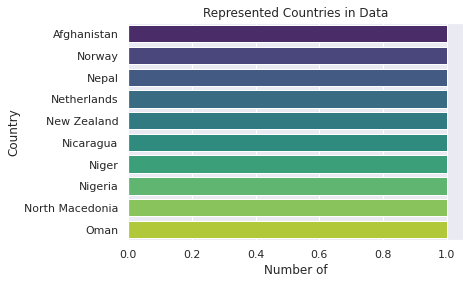

In [300]:
#Countries
sns.set_style('darkgrid')
ch=food['Country'].value_counts()[:10]
sns.barplot(x=ch,y=ch.index,palette='viridis')
plt.xlabel('Number of')
plt.ylabel('Country')
plt.title("Represented Countries in Data")
plt.show()

In [301]:
# total distinct countries in dataset
food.groupby('Country').count()

,Alcoholic Beverages,Animal Products,Animal fats,"Aquatic Products, Other",Cereals - Excluding Beer,Eggs,"Fish, Seafood",Fruits - Excluding Wine,Meat,Milk - Excluding Butter,...,Vegetable Oils,Vegetables,Obesity,Undernourished,Confirmed,Deaths,Recovered,Active,Population,Unit (all except Population)
Country,,,,,,,,,,,,,,,,,,,,,
Afghanistan,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,1
Albania,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,1
Algeria,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,1
Angola,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,1
Argentina,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Venezuela (Bolivarian Republic of),1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,1
Vietnam,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,1
Yemen,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,1


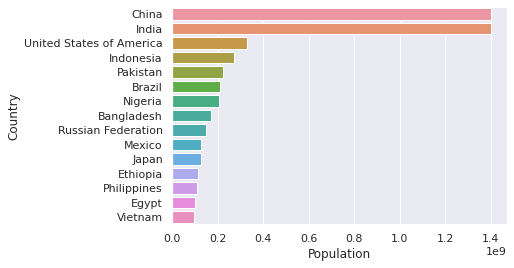

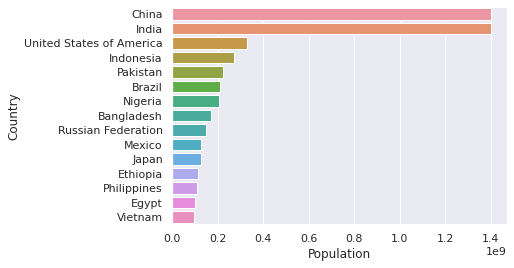

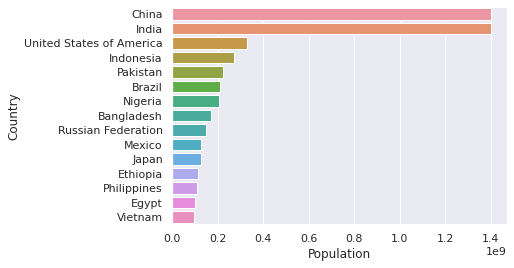

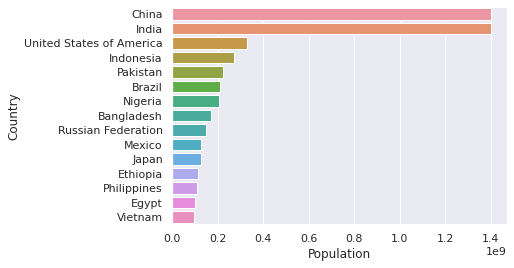

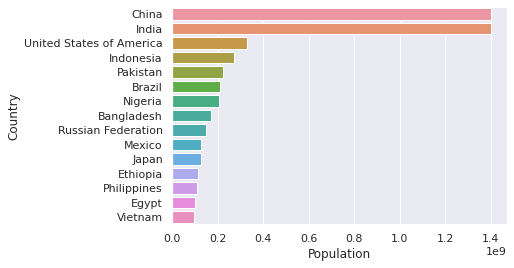

...

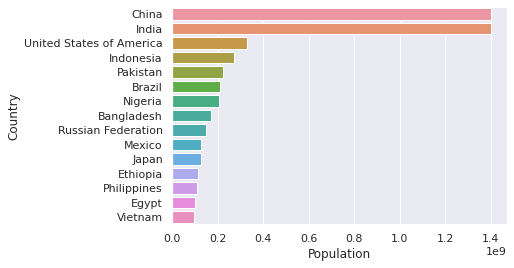

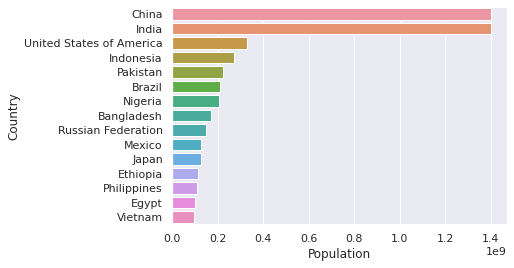

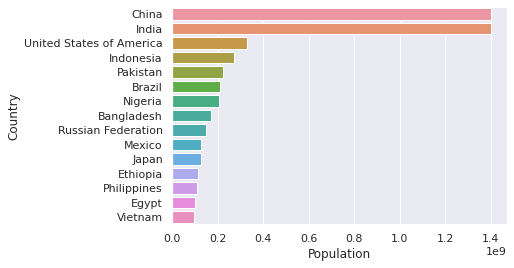

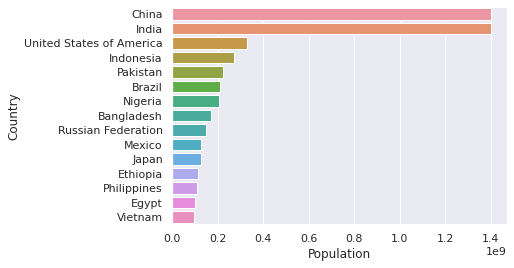

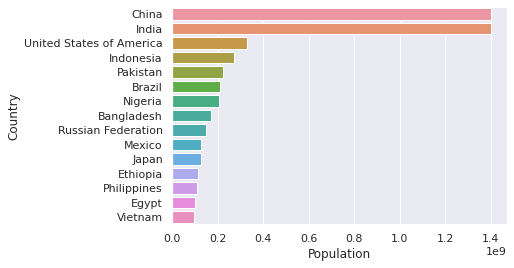

'sns.barplot(x = "Undernourished", y = \'Country\', \n            data = food.sort_values(by = [\'Undernourished\'], ascending = False).head(15))\nplt.show()\n\nsns.barplot(x = "Deaths", y = \'Country\', \n            data = food.sort_values(by = [\'Deaths\'], ascending = False).head(15))\nplt.show()\n\nsns.barplot(x = "Recovered", y = \'Country\', \n            data = food.sort_values(by = [\'Recovered\'], ascending = False).head(15))\nplt.show()'

In [302]:
#view population using food dataset
for col in food.iloc[:, 7:].columns:
    sns.barplot(x = 'Population', y = 'Country', 
                data = food.sort_values(by = ['Population'], ascending = False).head(15))
    plt.show()

#other examples 
'''sns.barplot(x = "Undernourished", y = 'Country', 
            data = food.sort_values(by = ['Undernourished'], ascending = False).head(15))
plt.show()

sns.barplot(x = "Deaths", y = 'Country', 
            data = food.sort_values(by = ['Deaths'], ascending = False).head(15))
plt.show()

sns.barplot(x = "Recovered", y = 'Country', 
            data = food.sort_values(by = ['Recovered'], ascending = False).head(15))
plt.show()'''

In [303]:
#how many countries have a population greater than mean?
food[food['Population']>food.Population.mean()].groupby(food.Country).count()

,Country,Alcoholic Beverages,Animal Products,Animal fats,"Aquatic Products, Other",Cereals - Excluding Beer,Eggs,"Fish, Seafood",Fruits - Excluding Wine,Meat,...,Vegetable Oils,Vegetables,Obesity,Undernourished,Confirmed,Deaths,Recovered,Active,Population,Unit (all except Population)
Country,,,,,,,,,,,,,,,,,,,,,
Bangladesh,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,1
Brazil,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,1
China,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,1
Colombia,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,1
Egypt,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,1
Ethiopia,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,1
France,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,1
Germany,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,1
India,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,1


In [304]:
#view confirmed cases in each country, food data set
fig = px.bar(food, x='Country', y='Confirmed').update_xaxes(categoryorder="total descending")
fig.show()

Montenegro, USA, Israel

In [305]:
#mean confirmed cases
food.Confirmed.mean()

2.060157012179627

In [306]:
#how many countries have a confirmed greater than mean?
food[food['Confirmed']>food.Confirmed.mean()].groupby(food.Country).count()

,Country,Alcoholic Beverages,Animal Products,Animal fats,"Aquatic Products, Other",Cereals - Excluding Beer,Eggs,"Fish, Seafood",Fruits - Excluding Wine,Meat,...,Vegetable Oils,Vegetables,Obesity,Undernourished,Confirmed,Deaths,Recovered,Active,Population,Unit (all except Population)
Country,,,,,,,,,,,,,,,,,,,,,
Albania,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,1
Argentina,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,1
Armenia,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,1
Austria,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,1
Azerbaijan,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,1
Belarus,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,1
Belgium,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,1
Belize,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,1
Bosnia and Herzegovina,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,1


In [307]:
#view deaths in each country, food data set
fig = px.bar(food, x='Country', y='Deaths').update_xaxes(categoryorder="total descending")
fig.show()

Belgium, Czechia , North Macedonia

In [308]:
#mean death by country
food.groupby('Country')['Deaths'].mean().sort_values()

Country
Dominica                            0.000000
Samoa                               0.000000
Cambodia                            0.000000
Solomon Islands                     0.000000
Lao People's Democratic Republic    0.000000
                                      ...   
Italy                               0.150927
Czechia                             0.159845
United Kingdom                      0.167220
Slovenia                            0.171755
Belgium                             0.185428
Name: Deaths, Length: 154, dtype: float64

/usr/local/lib/python3.7/dist-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



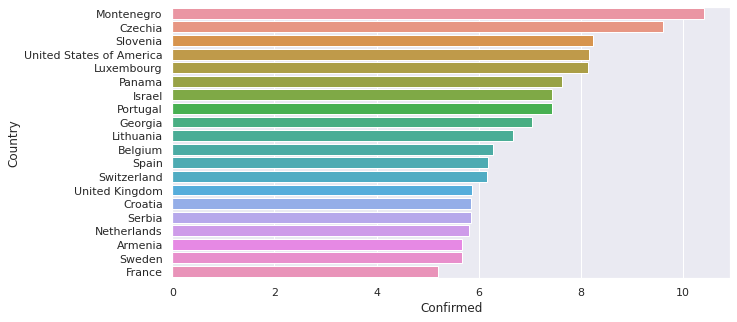

In [309]:
#confirmed deaths by country
fig, ax = plt.subplots(figsize=(10, 5))

df = food[['Country', 'Confirmed', 'Deaths', 'Recovered', 'Active']]
df.sort_values(by='Confirmed', ascending=False, inplace=True)
sns.barplot(x="Confirmed", y="Country", data=df[:20]);

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



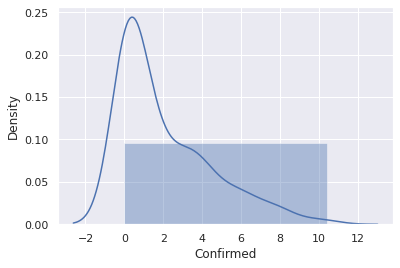

In [310]:
#distribution of confirmed cases
sns.distplot(food['Confirmed'], bins=1, kde= True)

In [311]:
#max confirmed in USA
food[food.Country=='United States of America'].groupby('Country')['Confirmed'].sum()

Country
United States of America    8.159922
Name: Confirmed, dtype: float64

In [312]:
#max deaths in Haiti
food[food.Country=='Haiti'].groupby('Country')['Deaths'].sum()

Country
Haiti    0.002149
Name: Deaths, dtype: float64

/usr/local/lib/python3.7/dist-packages/seaborn/categorical.py:3717: UserWarning:

The `factorplot` function has been renamed to `catplot`. The original name will be removed in a future release. Please update your code. Note that the default `kind` in `factorplot` (`'point'`) has changed `'strip'` in `catplot`.

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



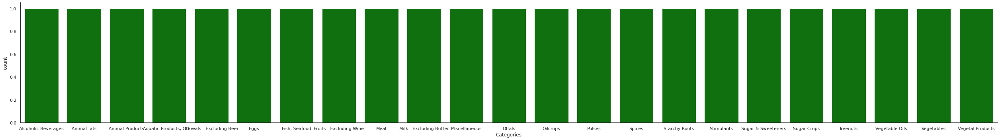

In [313]:
#how many categories in desc data? 
with sns.axes_style('white'):
  g = sns.factorplot("Categories", data = desc, aspect=7,
                     kind="count", color='green')

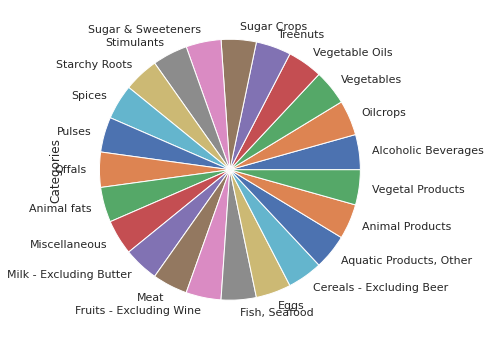

In [314]:
desc['Categories'].value_counts().plot(kind='pie', figsize=(6,6))

In [315]:
desc['Items'].value_counts().plot(kind='pie', figsize=(100,100))

In [316]:
#relationship of recoveries to confirmed cases color by country
px.scatter(fat, x="Recovered", y="Confirmed", color="Country")

In [317]:
#mean recovery by country
food.groupby('Country')['Recovered'].mean()

Country
Afghanistan                           0.123374
Albania                               1.792636
Algeria                               0.167572
Angola                                0.056808
Argentina                             3.905192
                                        ...   
Venezuela (Bolivarian Republic of)    0.424399
Vietnam                               0.001526
Yemen                                 0.004788
Zambia                                0.290524
Zimbabwe                              0.190964
Name: Recovered, Length: 154, dtype: float64

/usr/local/lib/python3.7/dist-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



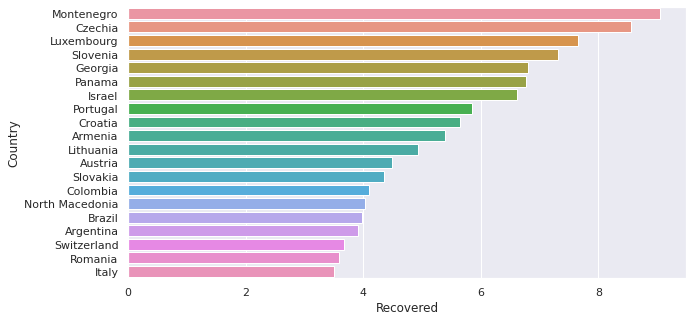

In [318]:
#recovery rate
fig, ax = plt.subplots(figsize=(10, 5))

df.sort_values(by='Recovered', ascending=False, inplace=True)
sns.barplot(x="Recovered", y="Country", data=df[:20]);

In [319]:
#new vairables Cure & Dead in food dataset
cure = food['Recovered'] / food['Confirmed'] * 100
dead = food['Deaths'] / food['Confirmed'] * 100
food.insert(6, 'Cure', np.array(cure))
food.insert(7, 'Dead', np.array(dead))
food.head(3)

,Country,Alcoholic Beverages,Animal Products,Animal fats,"Aquatic Products, Other",Cereals - Excluding Beer,Cure,Dead,Eggs,"Fish, Seafood",...,Vegetable Oils,Vegetables,Obesity,Undernourished,Confirmed,Deaths,Recovered,Active,Population,Unit (all except Population)
0,Afghanistan,0.0000,4.7774,0.8504,0.0,37.1186,86.801012,4.352069,0.1501,0.0000,...,2.3012,0.7504,4.5,29.8,0.142134,0.006186,0.123374,0.012574,38928000.0,%
1,Albania,0.9120,16.0930,1.0591,0.0,16.2107,60.413005,1.717095,0.8091,0.1471,...,2.8244,2.7508,22.3,6.2,2.967301,0.050951,1.792636,1.123714,2838000.0,%
2,Algeria,0.0896,6.0326,0.1941,0.0,25.0112,68.425559,2.677922,0.4181,0.1195,...,5.7638,2.0457,26.6,3.9,0.244897,0.006558,0.167572,0.070767,44357000.0,%


Text(0.5, 1.0, 'Relation of Recoveries to Confirmed Cases')

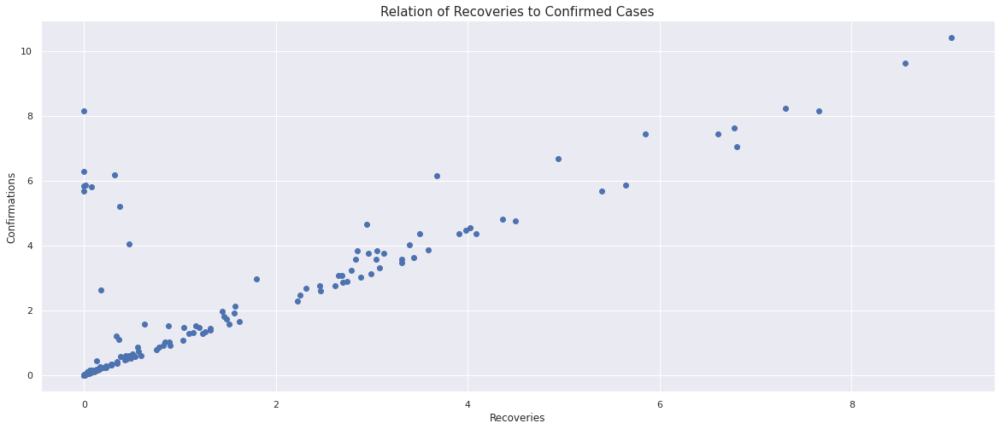

In [320]:
plt.figure(figsize=(20, 8))
x, y = food["Recovered"], food["Confirmed"]

sc = plt.scatter(x, y)
plt.xlabel("Recoveries")
plt.ylabel("Confirmations")
plt.title("Relation of Recoveries to Confirmed Cases", fontsize = 15)

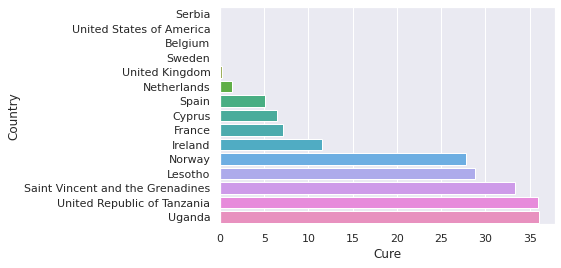

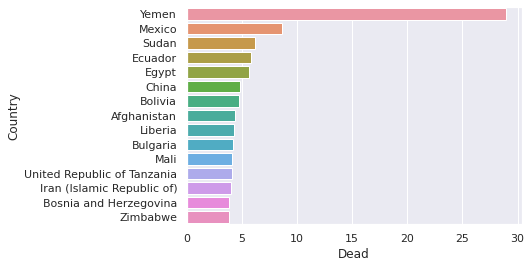

In [321]:
#view cure and dead by country 
sns.barplot(x = 'Cure', y = 'Country', 
                data = food.sort_values(by = ['Cure'], ascending = True).head(15)) #15 records
plt.show()

sns.barplot(x = 'Dead', y = 'Country', 
                data = food.sort_values(by = ['Dead'], ascending = False).head(15))
plt.show()

In [322]:
#3-D plot
fig = px.scatter_3d(food, x='Confirmed', y='Deaths', z='Recovered',
              color='Country')
fig.show()

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



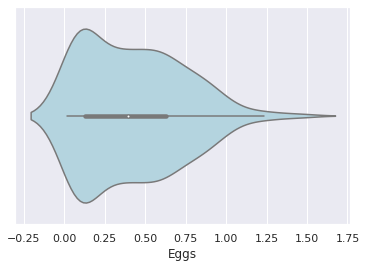

In [323]:
sns.violinplot("Eggs" , data=food,
               palette=["lightblue"]);

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



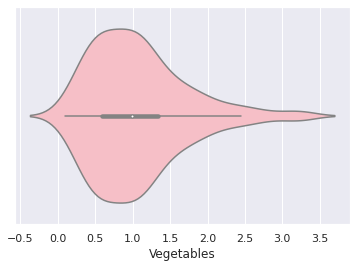

In [324]:
sns.violinplot("Vegetables" , data=food,
               palette=["lightpink"]);

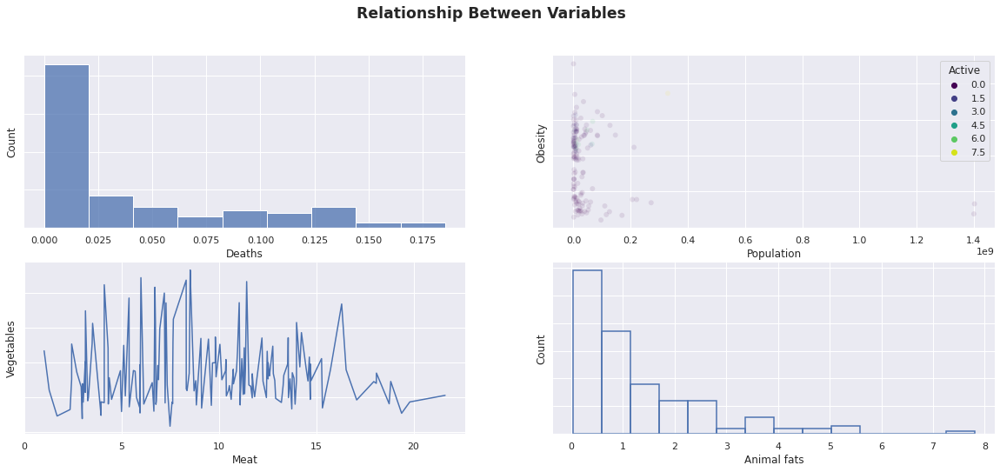

In [325]:
#Plotting Relationship Between Variables
fig=plt.figure(figsize=(20,8),facecolor='white')

plt.suptitle('Relationship Between Variables ',fontsize="xx-large",fontweight="bold")

gs=fig.add_gridspec(2,2)


ax=[_ for i in range(4)]

ax[0]=fig.add_subplot(gs[0,0])
ax[1]=fig.add_subplot(gs[0,1])
ax[2]=fig.add_subplot(gs[1,0])
ax[3]=fig.add_subplot(gs[1,1])

for i in range(4):
    ax[i].set_yticklabels([])
    ax[i].tick_params(axis='y',length=0)
    
    for direction in ["top","right", 'left']:
        ax[i].spines[direction].set_visible(False)
    
sns.histplot(data=food,x='Deaths',ax=ax[0],palette='flare')
sns.scatterplot(data=fat,x='Population',y='Obesity',hue='Active',ax=ax[1],palette='viridis',markers='o',alpha=0.1)
sns.lineplot(data=protein,x='Meat',y='Vegetables',ax=ax[2])
sns.histplot(data=food,x='Animal fats',ax=ax[3],fill=False,palette='flare')

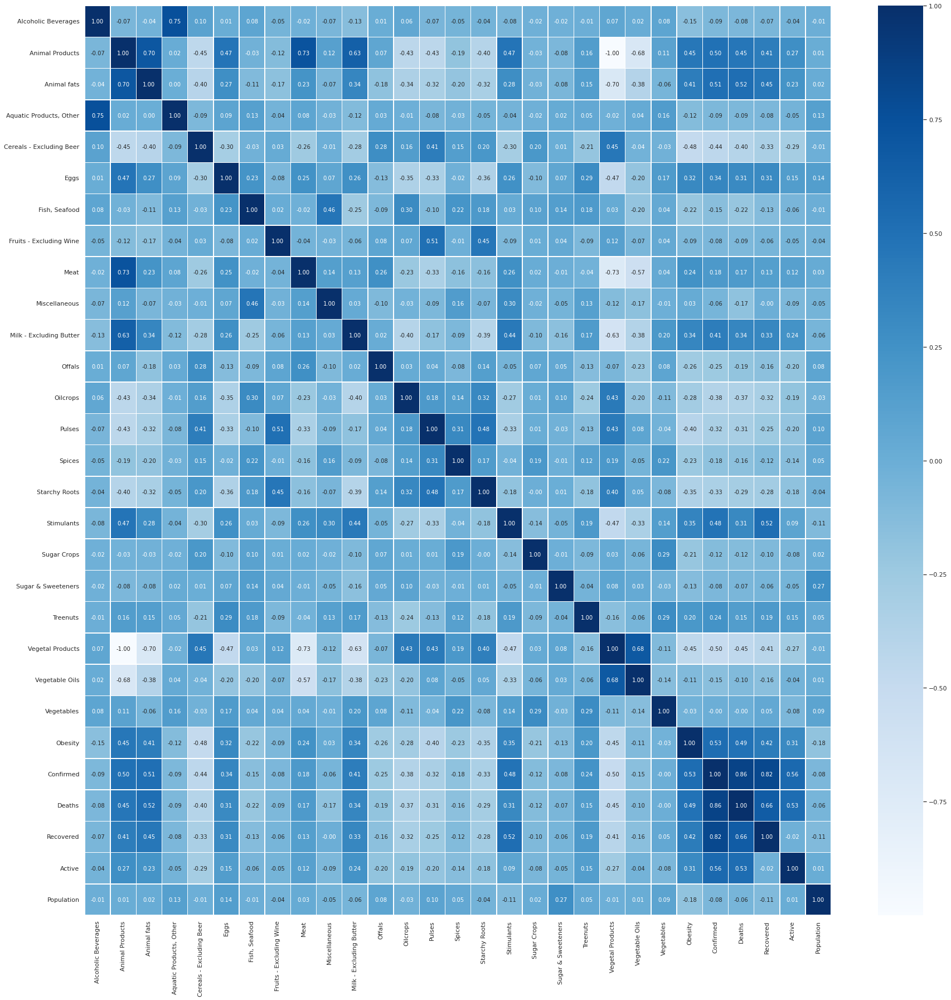

In [326]:
#correlation of fat data
fat_corr = fat.corr()
plt.figure(figsize=(30, 30))
sns.heatmap(fat_corr, annot=True, fmt = '.2f', linewidths=.5, cmap='Blues')

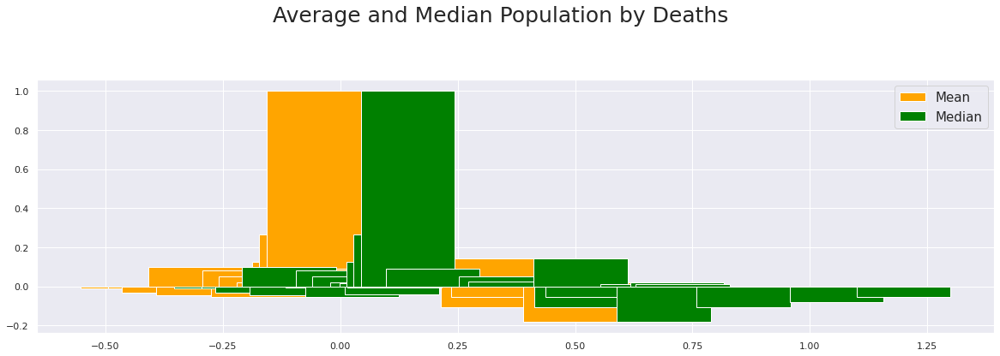

In [327]:
#Average and Median Population by Deaths

meanSpeed = fat_corr.groupby("Deaths")["Population"].mean()
medianSpeed = fat_corr.groupby("Deaths")["Population"].median()

meanSpeed.index.sort_values(ascending = False)
medianSpeed.index.sort_values(ascending = False)

plt.figure(figsize = (20, 12))
plt.suptitle("Average and Median Population by Deaths", fontsize = 25)

plt.subplot(2,1,1)
plt.bar(meanSpeed.index, meanSpeed, width = 0.2, color = "orange")
plt.bar(medianSpeed.index+0.2, medianSpeed, width = 0.2, color = "green")
plt.legend(["Mean", "Median"], fontsize = 15)


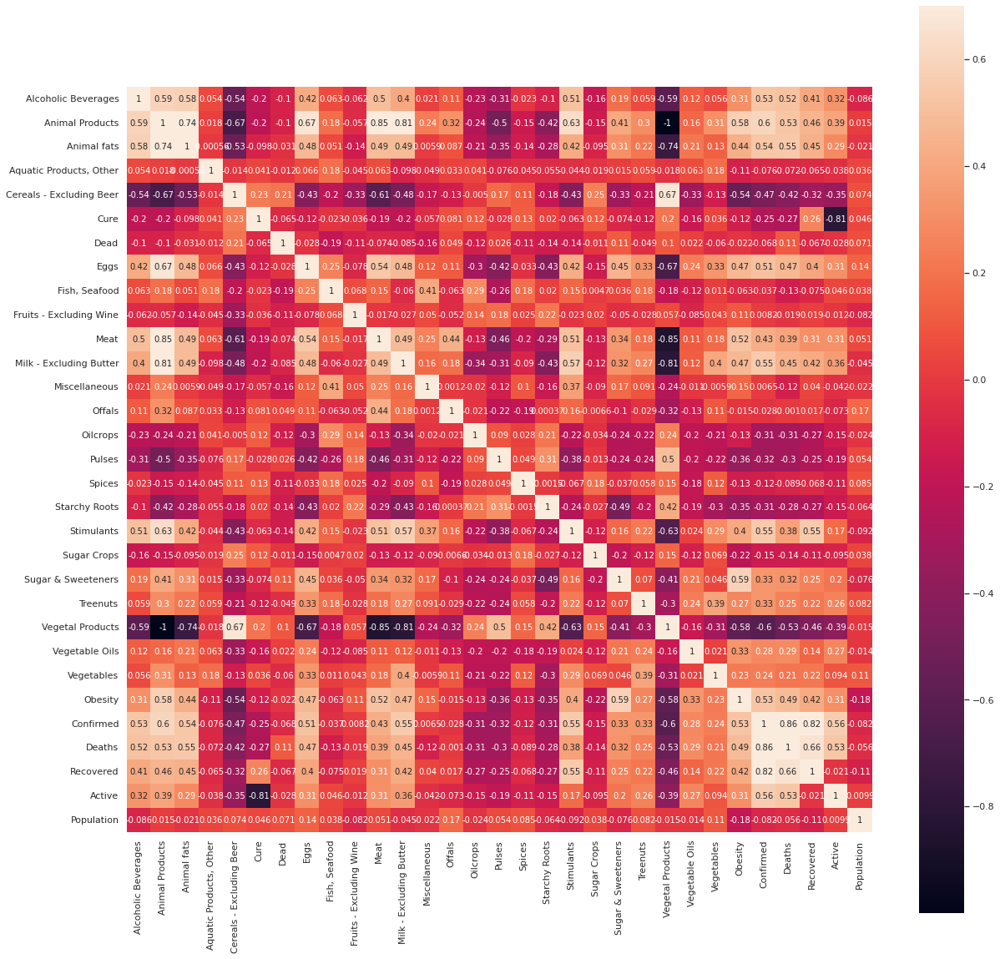

In [328]:
#food data correlations
corr = food
corr = corr.corr()

fig, ax = plt.subplots()
fig.set_size_inches(20,20)
sns.heatmap(corr,vmax=.7, square=True, annot=True)

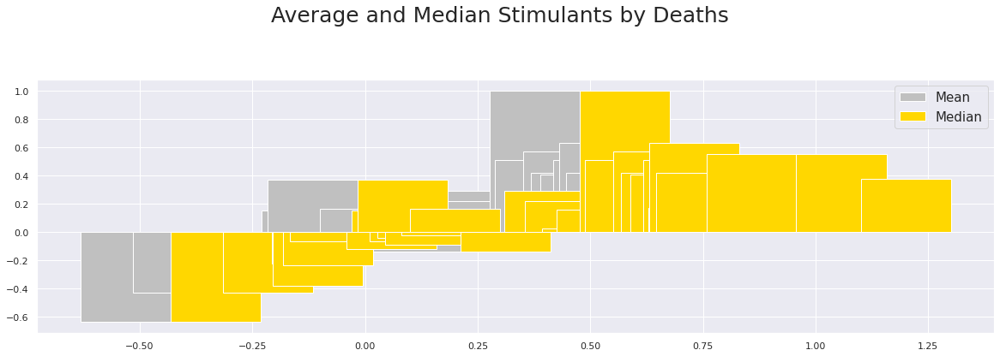

In [329]:
#Average and Median Sitmulants by Deaths
meanSpeed = corr.groupby("Deaths")["Stimulants"].mean()
medianSpeed = corr.groupby("Deaths")["Stimulants"].median()

meanSpeed.index.sort_values(ascending = False)
medianSpeed.index.sort_values(ascending = False)

plt.figure(figsize = (20, 12))
plt.suptitle("Average and Median Stimulants by Deaths", fontsize = 25)

plt.subplot(2,1,1)
plt.bar(meanSpeed.index, meanSpeed, width = 0.2, color = "silver")
plt.bar(medianSpeed.index+0.2, medianSpeed, width = 0.2, color = "gold")
plt.legend(["Mean", "Median"], fontsize = 15)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:5: DeprecationWarning:

`np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations



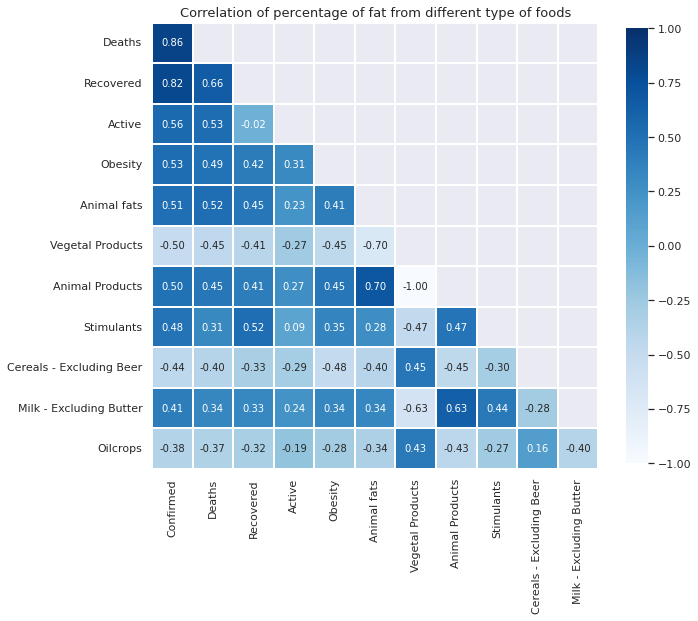

In [330]:
#more correlations
fig, ax = plt.subplots(figsize=(10, 10))

# get variable which the highest 12 variable
mask = np.triu(np.ones_like(fat[abs(fat.corr()['Confirmed']).sort_values(ascending=False)[:12].index].corr(), dtype=np.bool))
mask = mask[1:, :-1]
corr = fat[abs(fat.corr()['Confirmed']).sort_values(ascending=False)[:12].index].corr().iloc[1:,:-1]

sns.heatmap(corr, mask=mask, annot=True, fmt=".2f", cmap='Blues',linewidths = 1, square= True,
           vmin=-1, vmax=1, cbar_kws={"shrink": .8})

plt.title("Correlation of percentage of fat from different type of foods", fontsize = 13)
# plt.xlabel("Type of foods", fontsize = 13)
# plt.ylabel("Type of foods", fontsize = 13)
plt.show()

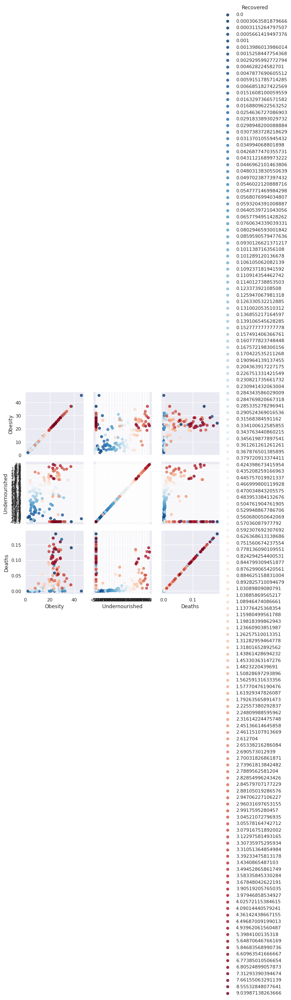

In [331]:
#Heat Map of Correlations
g = sns.PairGrid(protein, vars=['Obesity', 'Undernourished', 'Deaths'],
                 hue='Recovered', palette='RdBu_r')
g.map(plt.scatter, alpha=0.8)
g.add_legend();

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7fb87caa3390>,
      dtype=object)

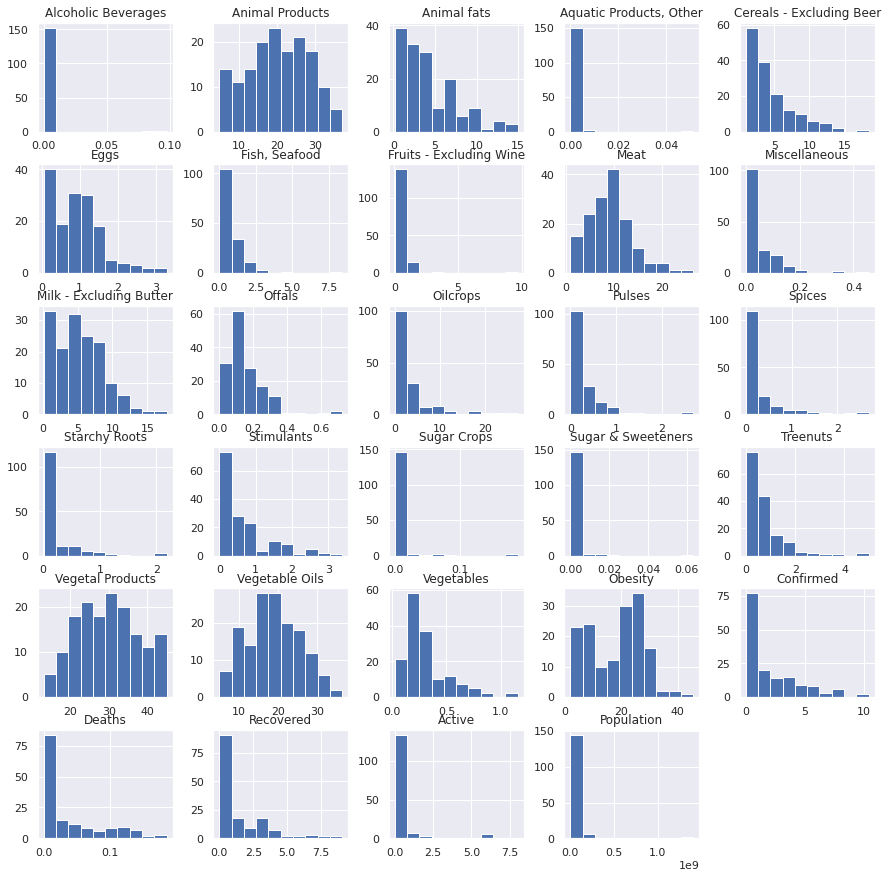

In [332]:
#histograms of fat dataset
fat.hist(figsize=(15,15))

In [333]:
food.head(2)

,Country,Alcoholic Beverages,Animal Products,Animal fats,"Aquatic Products, Other",Cereals - Excluding Beer,Cure,Dead,Eggs,"Fish, Seafood",...,Vegetable Oils,Vegetables,Obesity,Undernourished,Confirmed,Deaths,Recovered,Active,Population,Unit (all except Population)
0,Afghanistan,0.000,4.7774,0.8504,0.0,37.1186,86.801012,4.352069,0.1501,0.0000,...,2.3012,0.7504,4.5,29.8,0.142134,0.006186,0.123374,0.012574,38928000.0,%
1,Albania,0.912,16.0930,1.0591,0.0,16.2107,60.413005,1.717095,0.8091,0.1471,...,2.8244,2.7508,22.3,6.2,2.967301,0.050951,1.792636,1.123714,2838000.0,%


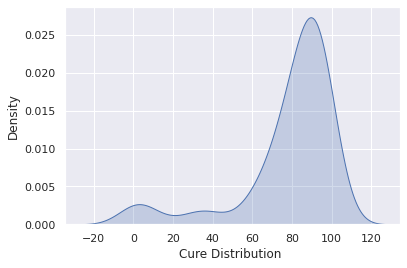

In [334]:
#distribution of Cure
sns.kdeplot(food["Cure"], label='FC', shade=True)
plt.xlabel('Cure Distribution ');

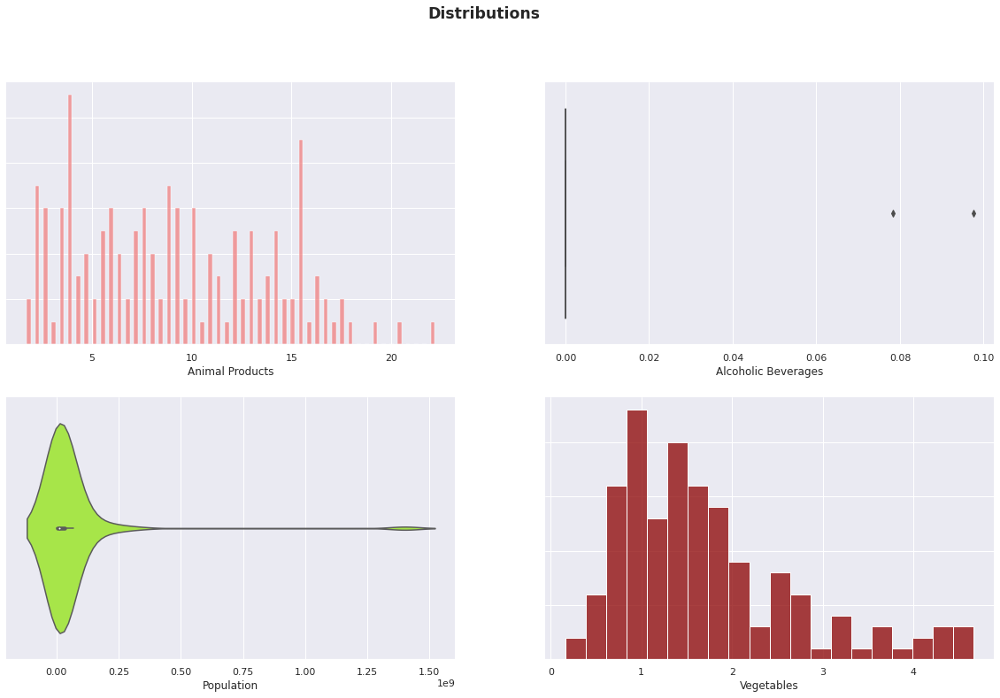

In [335]:
#other plots showing data
fig=plt.figure(figsize=(20,12),facecolor='white')

plt.suptitle('Distributions',weight='bold',fontsize='xx-large')

gs=fig.add_gridspec(2,2)

ax=[_ for i in range(4)]

ax[0]=fig.add_subplot(gs[0,0])
ax[1]=fig.add_subplot(gs[0,1])
ax[2]=fig.add_subplot(gs[1,0])
ax[3]=fig.add_subplot(gs[1,1])


sns.histplot(x="Animal Products",data=food,ax=ax[0],shrink=0.5,bins=50,color="lightcoral")
sns.histplot(x="Vegetables",data=protein,ax=ax[3],bins=20,color='darkred')
sns.boxplot(x='Alcoholic Beverages',data=fat,ax=ax[1],color='gold')
sns.violinplot(x="Population",data=food,ax=ax[2],color="greenyellow")

for i in range(4):
    
    ax[i].set_yticklabels('')
    ax[i].set_ylabel('')
    ax[i].tick_params('y',length=0)
    
    for direction in ['top','left','right']:
        
        ax[i].spines[direction].set_visible(False)

Text(0.5, 1.0, 'Relation of Death to Animal and Veggies')

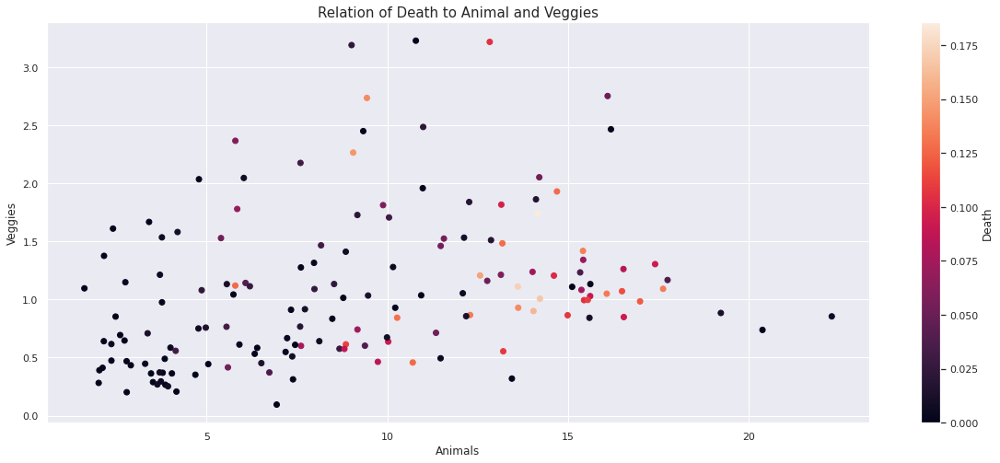

In [336]:
#Relation of Death to Animals and Veggies foods
plt.figure(figsize=(20, 8))
x, y, z = food["Animal Products"], food["Vegetables"], food["Deaths"]

sc = plt.scatter(x, y, c = z)
plt.xlabel("Animals")
plt.ylabel("Veggies")
plt.colorbar(sc, label = "Death")
plt.title("Relation of Death to Animal and Veggies", fontsize = 15)

Text(0, 0.5, 'Number')

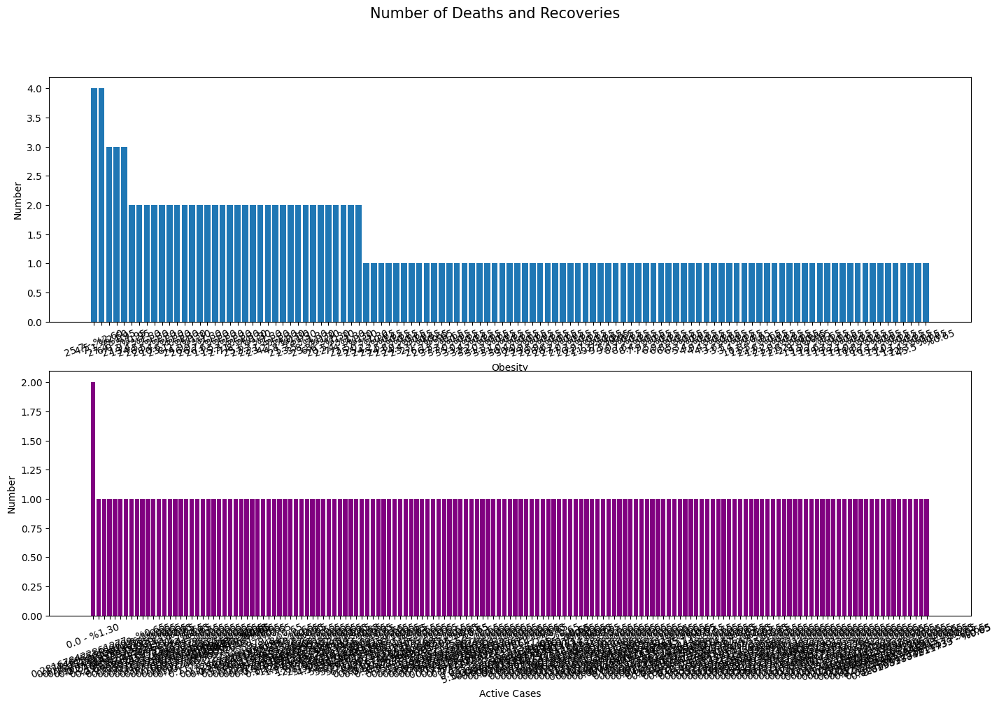

In [337]:
#more graphs
plt.style.use('default')

plt.figure(figsize=(17, 10))
plt.suptitle("Number of Deaths and Recoveries", fontsize = 15)

# # # # # # # # # # # # # # # # # # # # # # # # Bedroom

Country = food.value_counts("Obesity")
labels = list()
for i, j in enumerate(Country):
    labels.append("{} - %{:.2f}".format(Country.index[i], 100*j/Country.sum()))
    
plt.subplot(2,1,1)
plt.bar(labels, Country)
plt.xticks(rotation = 20)
plt.xlabel("Obesity")
plt.ylabel("Number")

# # # # # # # # # # # # # # # # # # # # # # # # Bathroom

Deaths = food.value_counts("Active")
labels = list()
for i, j in enumerate(Deaths):
    labels.append("{} - %{:.2f}".format(Deaths.index[i], 100*j/Deaths.sum()))
    
plt.subplot(2,1,2)
plt.bar(labels, Deaths, color = "purple")
plt.xticks(rotation = 20)
plt.xlabel("Active Cases")
plt.ylabel("Number")

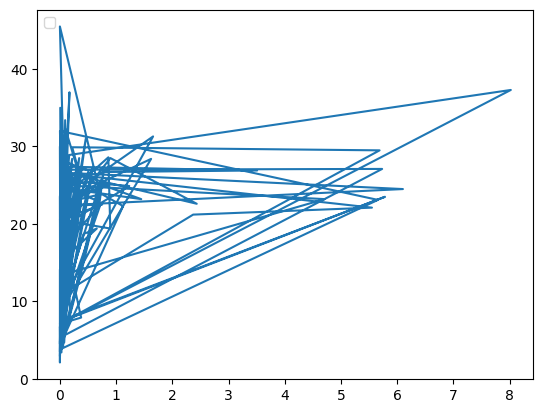

In [338]:
plt.plot(food['Active'], food['Obesity'])
plt.legend(ncol=2, loc='upper left')

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



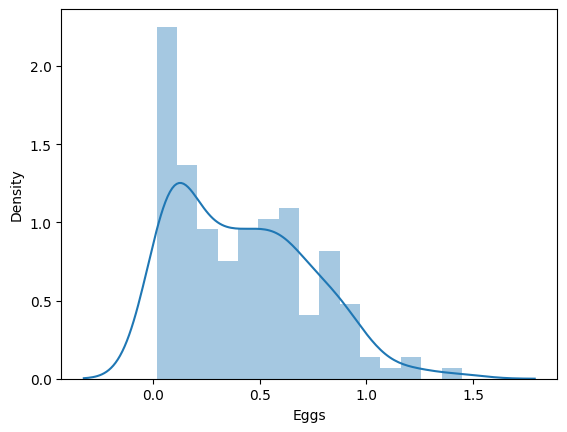

In [339]:
#taking a look at eggs
sns.distplot(food['Eggs'], bins=15, kde= True)

In [340]:
#create new variable called Mortality
food['Mortality'] = food['Deaths']/food['Confirmed']*100

In [341]:
#plot mortality rate
fig = px.bar(food, x='Country', y='Mortality').update_xaxes(categoryorder="total descending")
fig.show()

Yemen, Ecuador, Bolivia

In [342]:
#Relationship of mortality and obsetiy sized by active
fig = px.scatter(food, x="Mortality", y = "Obesity", size = "Active", hover_name='Country', log_x=False,
                 size_max=30, template="simple_white")

fig.add_shape(
        # Line Horizontal
            type="line",
            x0=0,
            y0=food['Obesity'].mean(),
            x1=food['Mortality'].max(),
            y1=food['Obesity'].mean(),
            line=dict(
                color="crimson",
                width=4
            ),
    )

fig.show()

USA, UK, Iraq

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:17: UserWarning:

Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations. 



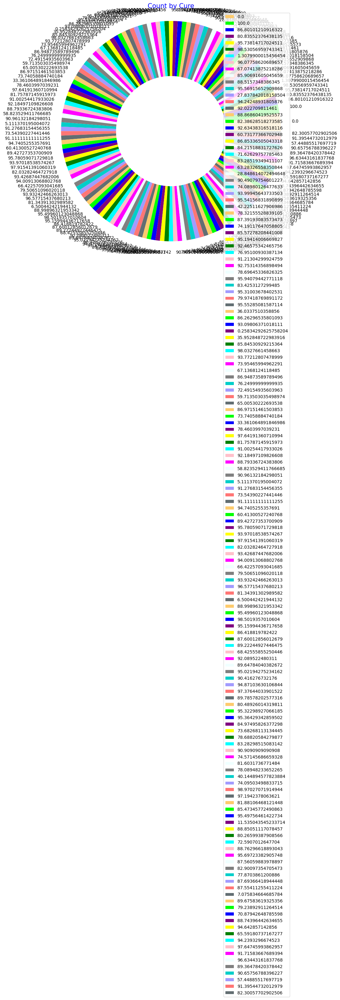

In [343]:
#Count by cure
food.dropna(inplace = True)
labels = food.Cure.value_counts().index
colors = ['#fdcb6e','lime','blue','purple','yellow','green','cyan','pink','magenta','azure','gray','#00cec9','#a29bfe','#ff7675','#636e72']
sizes = food.Cure.value_counts().values
explode=np.zeros((len(food.Cure.unique()),), dtype=int)
# visual
plt.figure(figsize = (10,10))
plt.title('Count by Cure',color = 'blue',fontsize = 15)
patches, texts = plt.pie(sizes,explode=explode, labels=labels, colors=colors)
centre_circle = plt.Circle((0, 0), 0.50, fc='white')
fig = plt.gcf()
fig.gca().add_artist(centre_circle)

plt.legend(patches, labels, loc="best")
plt.axis('equal')
plt.tight_layout()
plt.show()

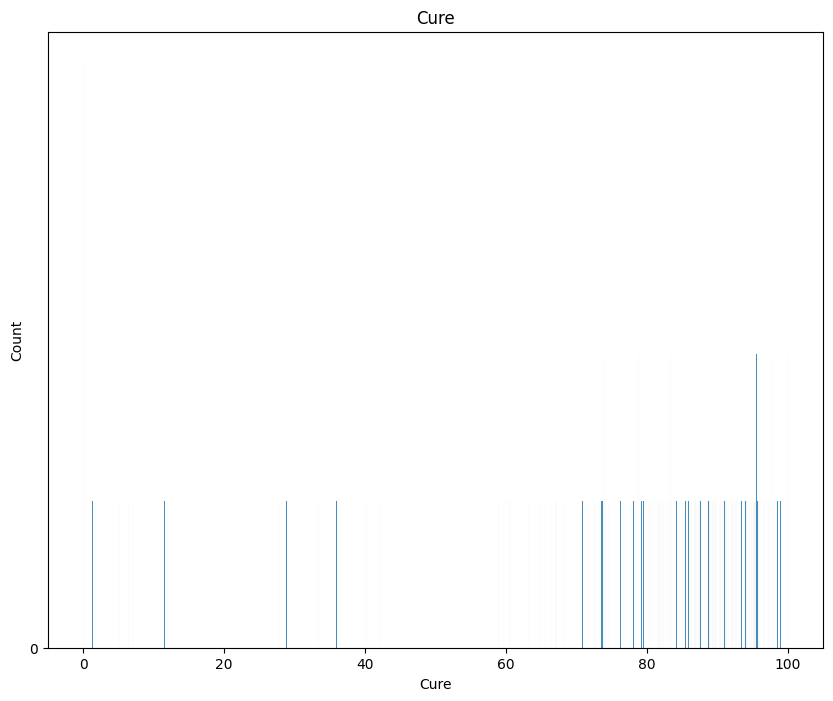

In [344]:
#plot of cure
ma = food['Cure']
plt.figure(figsize=(10,8))
sns.histplot(ma, bins=5000, alpha=0.8)
plt.yticks(list(range(0,50,5000)))
plt.title('Cure')
plt.show()

***Obesity:***

In [345]:
#mapping obesity
fig = px.choropleth(food, locations="Country",
                    color="Obesity", 
                    locationmode='country names',
                    color_continuous_scale=px.colors.sequential.Plasma)
fig.show()

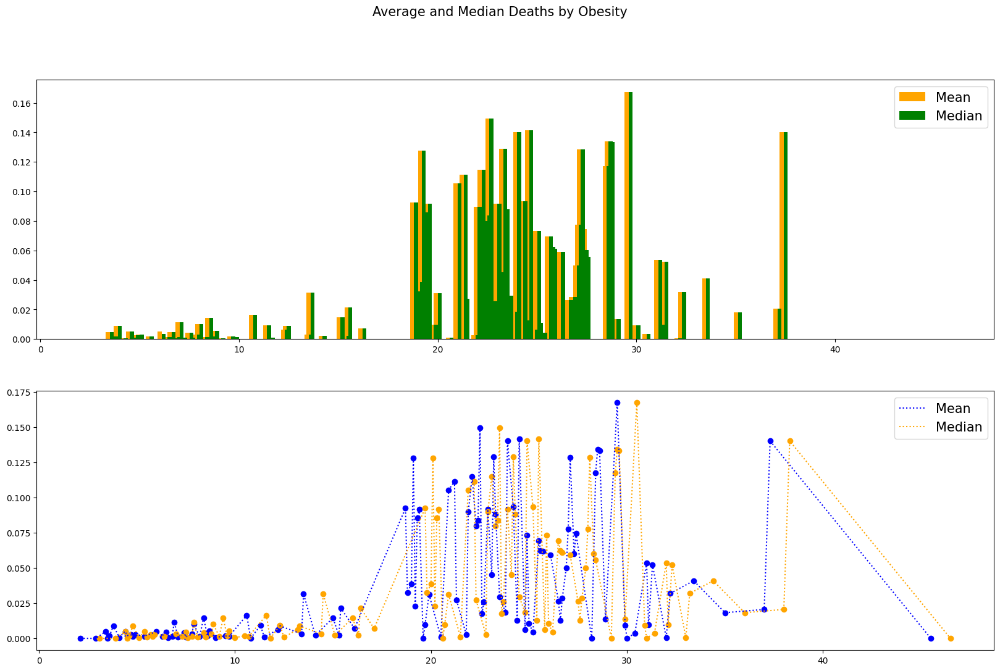

In [346]:
#Average and Median Deaths by Obesity
meanPrice = food.groupby("Obesity")["Deaths"].mean()
medianPrice = food.groupby("Obesity")["Deaths"].median()

meanPrice.index.sort_values(ascending = False)
medianPrice.index.sort_values(ascending = False)

plt.figure(figsize = (20, 12))
plt.suptitle("Average and Median Deaths by Obesity", fontsize = 15)

plt.subplot(2,1,1)
plt.bar(meanPrice.index, meanPrice, width = 0.2, color = "orange")
plt.bar(medianPrice.index+0.2, medianPrice, width = 0.2, color = "green")
plt.legend(["Mean", "Median"], fontsize = 15)

plt.subplot(2,1,2)
plt.scatter(meanPrice.index, meanPrice, color = "blue")
plt.scatter(medianPrice.index+1, medianPrice, color = "orange")
plt.plot(meanPrice.index, meanPrice, linestyle = ":", color = "blue")
plt.plot(medianPrice.index+1, medianPrice, linestyle = ":", color = "orange",)
plt.legend(["Mean", "Median"], fontsize = 15)

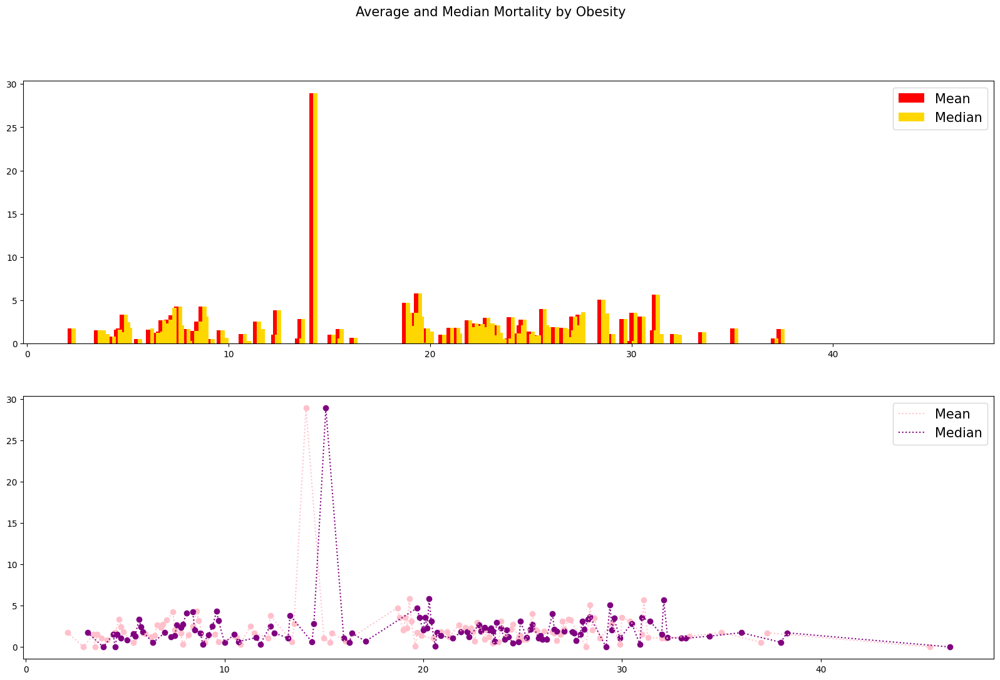

In [347]:
#Average and Median Deaths by Obesity
meanPrice = food.groupby("Obesity")["Mortality"].mean()
medianPrice = food.groupby("Obesity")["Mortality"].median()

meanPrice.index.sort_values(ascending = False)
medianPrice.index.sort_values(ascending = False)

plt.figure(figsize = (20, 12))
plt.suptitle("Average and Median Mortality by Obesity ", fontsize = 15)

plt.subplot(2,1,1)
plt.bar(meanPrice.index, meanPrice, width = 0.2, color = "red")
plt.bar(medianPrice.index+0.2, medianPrice, width = 0.2, color = "gold")
plt.legend(["Mean", "Median"], fontsize = 15)

plt.subplot(2,1,2)
plt.scatter(meanPrice.index, meanPrice, color = "pink")
plt.scatter(medianPrice.index+1, medianPrice, color = "purple")
plt.plot(meanPrice.index, meanPrice, linestyle = ":", color = "pink")
plt.plot(medianPrice.index+1, medianPrice, linestyle = ":", color = "purple",)
plt.legend(["Mean", "Median"], fontsize = 15)

In [348]:
#create new data frame for high obesity and low obesity 
high_ob = food[food.Obesity > food['Obesity'].mean()]
low_ob = food[food.Obesity <= food['Obesity'].mean()]

In [349]:
#view
high_ob = high_ob.sort_values(by=['Obesity'], ascending=False)
high_ob

,Country,Alcoholic Beverages,Animal Products,Animal fats,"Aquatic Products, Other",Cereals - Excluding Beer,Cure,Dead,Eggs,"Fish, Seafood",...,Vegetables,Obesity,Undernourished,Confirmed,Deaths,Recovered,Active,Population,Unit (all except Population),Mortality
131,Samoa,0.5210,13.4454,2.0000,0.0336,9.6134,100.000000,0.000000,0.1513,1.7479,...,0.3193,45.5,2.7,0.001000,0.000000,0.001000,0.000000,200000.0,%,0.000000
161,United States of America,2.1373,13.6201,1.3009,0.0000,10.7792,0.000000,1.716965,0.7832,0.4779,...,0.9292,37.3,<2.5,8.159922,0.140103,0.000000,8.019819,329878000.0,%,1.716965
83,Kuwait,0.0000,9.1727,0.5806,0.0000,20.4209,94.740526,0.566939,1.0160,0.3048,...,1.7271,37.0,2.8,3.624728,0.020550,3.434087,0.170092,4691000.0,%,0.566939
133,Saudi Arabia,0.0000,7.5900,0.7825,0.0000,23.4585,97.641914,1.729101,0.4069,0.3286,...,0.7668,35.0,7.1,1.055795,0.018256,1.030898,0.006641,35041000.0,%,1.729101
77,Jordan,0.0553,6.0796,0.5527,0.0000,22.0892,95.697234,1.308652,0.2395,0.2211,...,1.1422,33.4,12.2,3.126276,0.040912,2.991760,0.093604,10679000.0,%,1.308652
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
63,Guyana,0.5719,9.0121,0.2080,0.0000,21.2998,87.693664,2.267288,0.1213,0.8666,...,3.1889,19.2,8.1,1.008767,0.022872,0.884625,0.101271,787000.0,%,2.267288
120,Peru,1.5529,5.7963,0.1806,0.0000,21.2893,92.634383,3.574714,0.5778,0.8848,...,1.1195,19.1,9.7,3.573742,0.127751,3.310514,0.135477,32824000.0,%,3.574714
119,Paraguay,1.8252,9.3813,1.1863,0.0000,15.8241,82.386285,2.039926,0.7848,0.1460,...,0.6023,19.0,10.7,1.896664,0.038691,1.562591,0.295382,7255000.0,%,2.039926
60,Guatemala,0.5887,5.5534,0.3925,0.0000,23.8619,91.395447,3.592800,0.9419,0.0981,...,0.7653,18.8,15.2,0.901899,0.032403,0.824294,0.045201,18066000.0,%,3.592800


Samoa > USA > Kuwait > Saudi Arabia > Jordan

Text(0.5, 1.0, 'Relation of Recovery and Deaths to Obesity')

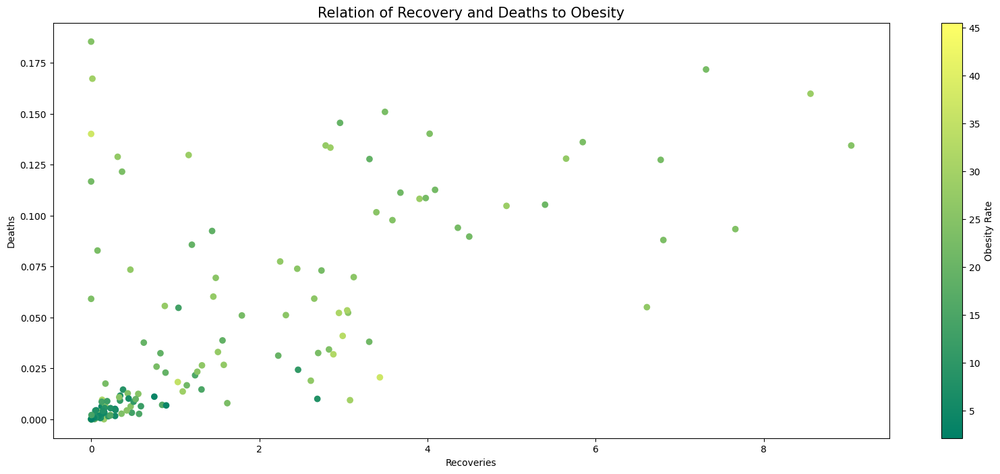

In [350]:
# Relation of obesity (protein data) to recovery(food) and deaths(protein) different data sources
plt.figure(figsize=(20, 8))
x, y, z = food["Recovered"], protein["Deaths"], protein["Obesity"]

sc = plt.scatter(x, y, c = z, cmap="summer")
plt.xlabel("Recoveries")
plt.ylabel("Deaths")
plt.colorbar(sc, label = "Obesity Rate")
plt.title("Relation of Recovery and Deaths to Obesity", fontsize = 15)

In [351]:
#create two new dataframes
animal_features = ['Animal fats', 'Aquatic Products, Other', 'Eggs', 'Fish, Seafood', 'Meat',
                   'Milk - Excluding Butter', 'Offals']
vegetal_features = ['Alcoholic Beverages', 'Cereals - Excluding Beer', 'Fruits - Excluding Wine', 'Miscellaneous', 'Oilcrops', 'Pulses',
                    'Spices', 'Starchy Roots', 'Stimulants', 'Sugar & Sweeteners', 'Sugar Crops', 'Treenuts',
                    'Vegetable Oils', 'Vegetables']

In [352]:
#animal features of high obesity and low obesity
fig = px.pie(values = high_ob[animal_features].mean().tolist(), names = animal_features,
             title='High Obesity Animal Features')
fig.show()

fig = px.pie(values = low_ob[animal_features].mean().tolist(), names = animal_features,
             title='Low Obesity Animal Features')
fig.show()

In [353]:
#veggie features of high obesity and low obesity
fig = px.pie(values = high_ob[vegetal_features].mean().tolist(), names = vegetal_features,
             title='High Obesity Veggie Features')
fig.show()

fig = px.pie(values = low_ob[vegetal_features].mean().tolist(), names = vegetal_features,
             title='Low Obesity Veggie Features')
fig.show()

In [354]:
#mean 
fig = px.pie(values = [high_ob[animal_features].mean().mean(),low_ob[animal_features].mean().mean()], 
             names = ['High Obesity Country', 'Low Obesity Country'],
             title='Plot 1')
fig.show()

fig = px.pie(values = [low_ob[vegetal_features].mean().mean(),high_ob[vegetal_features].mean().mean()], 
             names = ['High Obesity Country', 'Low Obesity Country'],
             title='Plot 2')
fig.show()

***Nourishment:***

In [355]:
#relationship of undersnourtished to obesity 
fig = px.scatter(food, x="Undernourished", y = "Obesity", size = "Active", hover_name='Country', log_x=False,
                 size_max=30, template="simple_white")

fig.add_shape(
        # Line Horizontal
            type="line",
            x0=0,
            y0=food['Obesity'].mean(),
            x1=food['Undernourished'].max(),
            y1=food['Obesity'].mean(),
            line=dict(
                color="crimson",
                width=4
            ),
    )

fig.show()

In [356]:
#plot food features
fig = px.pie(values = food[vegetal_features].mean().tolist(), names = vegetal_features,
             title='Veggie Features')
fig.show()

fig = px.pie(values = food[animal_features].mean().tolist(), names = animal_features,
             title='Animal Features')
fig.show()

In [357]:
#mean
fig = px.pie(values = [food[animal_features].mean().mean(),food[vegetal_features].mean().mean()], 
             names = ['Animal', 'Veggie'],
             title='Food Consumption')
fig.show()


In [361]:
#plot relationship between mortality rate and obesity
fig = px.scatter(food, x="Mortality", y = "Obesity", size = "Mortality", hover_name='Country', log_x=False,
                 size_max=30, template="simple_white")

fig.add_shape(
        # Line Horizontal
            type="line",
            x0=0,
            y0=food['Obesity'].mean(),
            x1=food['Obesity'].max(),
            y1=food['Obesity'].mean(),
            line=dict(
                color="gold",
                width=4
            ),
    )

fig.show()